# Region3 - All 479
## Xiaonan Wang
## 22Aug2026

### Setup and paths

In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(SeuratObject)
  library(dplyr)
  library(tidyr)
  library(tibble)
  library(Matrix)
  library(ggplot2)
})

set.seed(1234)

In [2]:
PROJECT_ROOT <- "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium"
PIPELINE_REPO <- file.path(PROJECT_ROOT, "adipose_analysis", "YNH_Xenium_scWAT")
RUN_LABEL <- "full_notebook_qc_v2"
QC_RUN_ROOT <- file.path(
  PROJECT_ROOT,
  "adipose_analysis",
  "scwat_qc_outputs",
  RUN_LABEL
)
DOWNSTREAM_ROOT <- file.path(
  PROJECT_ROOT,
  "adipose_analysis",
  "scwat_downstream_outputs",
  RUN_LABEL
)
ANCHOR_ROOT <- file.path(
  DOWNSTREAM_ROOT,
  "03_region3_All479"
)
INPUT_ROOT <- file.path(PROJECT_ROOT, "adipose_data")

In [40]:
source(file.path(PIPELINE_REPO, "R", "source.R"))

In [12]:
assert_path_within(PROJECT_ROOT, QC_RUN_ROOT)
assert_path_within(PROJECT_ROOT, DOWNSTREAM_ROOT)
dir.create(DOWNSTREAM_ROOT, recursive = TRUE, showWarnings = FALSE)
assert_path_within(PROJECT_ROOT, ANCHOR_ROOT)
dir.create(ANCHOR_ROOT, recursive = TRUE, showWarnings = FALSE)

In [13]:
REGION_ID = "Region_3"

### Create Seurat Obj

In [6]:
region_data <- readRDS(
  file.path(
    PROJECT_ROOT,
    "adipose_analysis",
    "scwat_qc_outputs",
    RUN_LABEL,
    "downstream_inputs",
    paste0(REGION_ID, ".downstream_input.rds")
  )
)

In [7]:
names(region_data)

[1] "schema_version"       "region_id"            "section_status"      
 [4] "counts"               "features"             "cell_metadata"       
 [7] "gene_sets"            "raw_counts_preserved" "downstream_contract" 
[10] "mapping_requirements" "provenance"

In [8]:
colnames(region_data$cell_metadata)

[1] "cell_id"                                  
 [2] "x_centroid"                               
 [3] "y_centroid"                               
 [4] "transcript_counts"                        
 [5] "control_probe_counts"                     
 [6] "genomic_control_counts"                   
 [7] "control_codeword_counts"                  
 [8] "unassigned_codeword_counts"               
 [9] "deprecated_codeword_counts"               
[10] "total_counts"                             
[11] "cell_area"                                
[12] "nucleus_area"                             
[13] "nucleus_count"                            
[14] "segmentation_method"                      
[15] "region_id"                                
[16] "nCount_Xenium"                            
[17] "nFeature_Xenium"                          
[18] "control_fraction_cell"                    
[19] "nucleus_missing_flag"                     
[20] "multiple_nuclei_flag"                     
[21] "cell_area_outlier_flag"                   
[22] "high_control_flag"                        
[23] "segmentation_multiplet_flag"              
[24] "qc_core_pass"                             
[25] "qc_review_flag"                           
[26] "mouse_id"                                 
[27] "section_id"                               
[28] "biological_replicate_id"                  
[29] "genotype"                                 
[30] "treatment"                                
[31] "condition"                                
[32] "age_weeks"                                
[33] "metadata_status"                          
[34] "do_not_interpret"                         
[35] "grid_x"                                   
[36] "grid_y"                                   
[37] "grid_id"                                  
[38] "edge_proxy"                               
[39] "grid_size_um"                             
[40] "local_density"                            
[41] "dense_aggregate"                          
[42] "primary_include"                          
[43] "strict_include"                           
[44] "hotspot_review_cell"                      
[45] "hotspot_sensitivity_include"              
[46] "section_status"                           
[47] "mask_rule_primary"                        
[48] "mask_rule_strict"                         
[49] "mask_rule_hotspot_sensitivity"            
[50] "provenance"                               
[51] "run_label"                                
[52] "execution_mode"                           
[53] "generated_utc"                            
[54] "source_artifact"                          
[55] "section_input_cells"                      
[56] "section_primary_include_cells"            
[57] "section_strict_include_cells"             
[58] "section_hotspot_sensitivity_include_cells"
[59] "qc_threshold_source"

In [9]:
# EOS features
EOS_GENE_SET_PATH <- file.path(
  PIPELINE_REPO,
  "config",
  "eos_gene_sets.tsv"
)

eos_gene_sets <- read.delim(
  EOS_GENE_SET_PATH,
  stringsAsFactors = FALSE
)

In [10]:
# Identity-transfer panel:
# complete 479-gene panel minus short-/long-lived Eos state genes.
# This retains the original 379 mMulti genes plus the 7 common Eos identity genes.

eos_state_genes <- unique(
  eos_gene_sets$gene[
    eos_gene_sets$gene_set %in% c("short_lived", "long_lived")
  ]
)

raw_panel_genes <- region_data$gene_sets$raw_complete_panel

identity_panel_genes <- setdiff(
  raw_panel_genes,
  eos_state_genes
)

cat("Raw panel genes:", length(raw_panel_genes), "\n")
cat("Eos state genes excluded:", length(intersect(raw_panel_genes, eos_state_genes)), "\n")
cat("Identity panel genes:", length(identity_panel_genes), "\n")

stopifnot(length(raw_panel_genes) == 479L)


Raw panel genes: 479 
Eos state genes excluded: 93 
Identity panel genes: 386 


In [11]:
FIX_GENESET = raw_panel_genes

In [12]:
region_info <- discover_one_section(
  input_root = INPUT_ROOT,
  region_id = REGION_ID
)
REGION_XENIUM_DIR <- region_info$region_dir

In [13]:
region_info

region_id,region_number,region_dir
<chr>,<int>,<chr>
Region_3,3,/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/adipose_data/output-XETG00205__0104985__Region_3__20260805__124712


In [248]:
# # does not work
# datadir = "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/adipose_data/output-XETG00205__0104985__Region_3__20260805__124712
# "
# test = LoadXenium(datadir, fov = "fov", segmentations = "cell")

In [14]:
list.files(
  REGION_XENIUM_DIR,
  recursive = FALSE
)

[1] "analysis"                     "analysis_summary.html"       
 [3] "analysis.zarr.zip"            "aux_outputs"                 
 [5] "cell_boundaries.csv.gz"       "cell_boundaries.parquet"     
 [7] "cell_feature_matrix"          "cell_feature_matrix.h5"      
 [9] "cell_feature_matrix.zarr.zip" "cells.csv.gz"                
[11] "cells.parquet"                "cells.zarr.zip"              
[13] "experiment.xenium"            "gene_panel.json"             
[15] "metrics_summary.csv"          "morphology_focus"            
[17] "morphology.ome.tif"           "nucleus_boundaries.csv.gz"   
[19] "nucleus_boundaries.parquet"   "transcripts.parquet"         
[21] "transcripts.zarr.zip"

In [15]:
region_spatial <- region_bundle_to_spatial_seurat(
  region_data = region_data,
  xenium_dir = REGION_XENIUM_DIR,
  mask = NULL,
  genes = "raw_complete_panel",
  project = "Region_3",
  assay = "Xenium",
  fov = "fov",
  include_cell_segmentation = TRUE,
  include_nucleus_segmentation = TRUE
)

Creating compact cell segmentation from 1,896,500 vertices across 75,957 cells.

Creating compact nucleus segmentation from 1,854,684 vertices across 74,284 cells.

Created spatial Seurat object: Region_3

  Cells: 75,957

  Genes: 479

  FOV: fov

  Boundaries: centroids, segmentation, nucleus_segmentation

  Native Xenium segmentations loaded: segmentation, nucleus_segmentation



In [16]:
region_spatial

An object of class Seurat 
479 features across 75957 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: fov

In [17]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [18]:
# Normalisation - better use lognormlize rather than SCTransform
DefaultAssay(region_spatial) <- "Xenium"

region_spatial <- NormalizeData(
  region_spatial,
  assay = "Xenium",
  normalization.method = "LogNormalize",
  scale.factor = 10000,
  verbose = FALSE
)

In [19]:
region_spatial

An object of class Seurat 
479 features across 75957 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 2 layers present: counts, data
 1 spatial field of view present: fov

In [20]:
# only use the cell type genes for PCA as key features
region_spatial <- ScaleData(
  region_spatial,
  assay = "Xenium",
  features = FIX_GENESET,
  verbose = FALSE
)

region_spatial <- RunPCA(
  region_spatial,
  assay = "Xenium",
  features = FIX_GENESET,
  npcs = 30,
  seed.use = 1234,
  verbose = FALSE
)

In [21]:
region_spatial

An object of class Seurat 
479 features across 75957 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 1 dimensional reduction calculated: pca
 1 spatial field of view present: fov

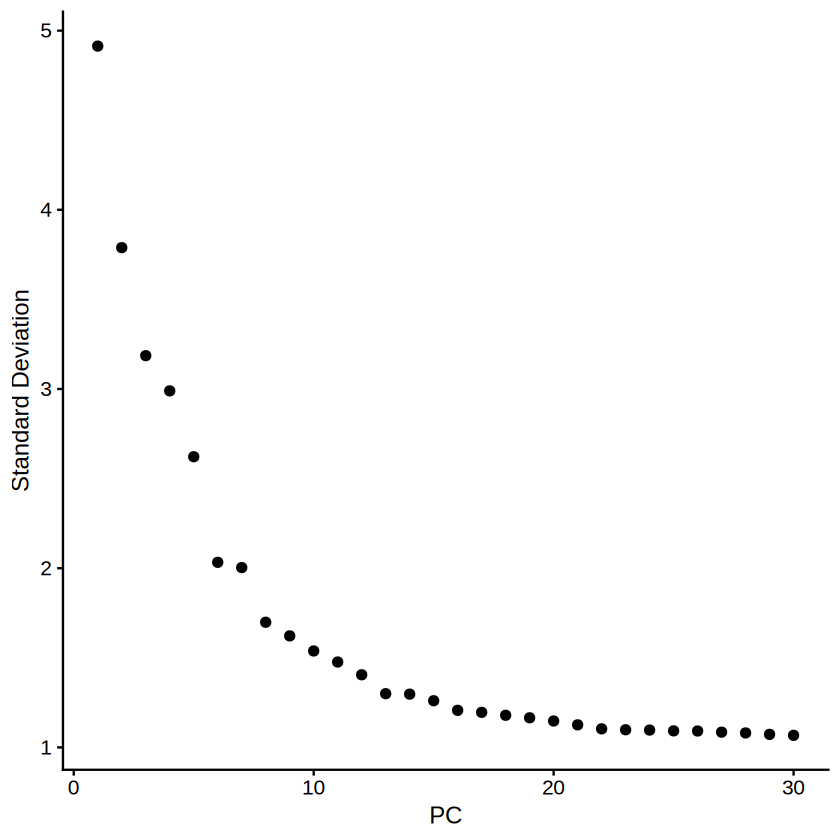

In [22]:
ElbowPlot(
  region_spatial,
  ndims = 30
)

In [23]:
options(repr.plot.width=12, repr.plot.height=12)

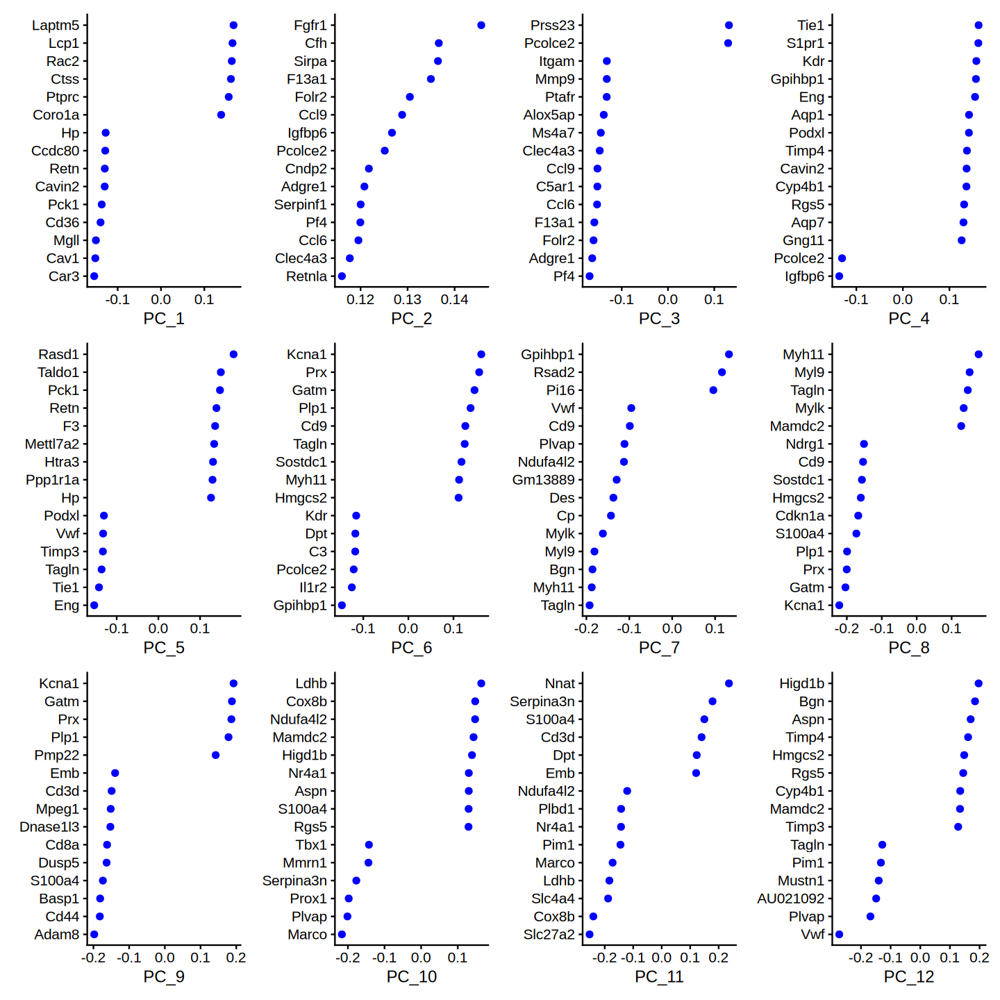

In [24]:
VizDimLoadings(
  region_spatial,
  dims = 1:12,
  reduction = "pca",
  nfeatures = 15
)

- PC1: Laptm5, Ctss, Rac2 versus Dpt, Aqp7, Retn, Cavin2, Cd36, Cav1 — broadly immune versus adipose/stromal structure.
- PC3: Mfap5, Igfbp6, Pcolce2 versus Itgam, Alox5ap, Ms4a7, C5ar1, Folr2, Pf4 — stromal versus myeloid.
- PC4: Eng, Tie1, Podxl, Plvap, Gng11, Kdr with Tagln, Myh11, Myl9 — vascular/endothelial–mural structure.
- PC5: lymphoid/immune genes such as Satb1, Rac2, Cd8a contrasted with macrophage-associated C5ar1, Folr2, Retnla, Pf4.
- PC6/8: very clearly vascular/mural structure, with Kdr, Tie1, Gpihbp1 versus Myh11, Tagln, Myl9.
- PC7: contains Plp1, Prx, Kcna1, which may indicate a peripheral nerve/Schwann-like axis; this will be worth checking spatially.
- PC9/10: appear to represent additional endothelial/lymphatic/immune-stromal distinctions.

In [25]:
pcs <- Embeddings(
  region_spatial,
  reduction = "pca"
)

qc_vars <- c(
  "nCount_Xenium",
  "nFeature_Xenium",
  "cell_area"
)

qc_vars <- qc_vars[
  qc_vars %in% colnames(region_spatial@meta.data)
]

In [26]:
pc_qc_cor <- sapply(
  qc_vars,
  function(v) {
    apply(
      pcs,
      2,
      function(pc) {
        cor(
          pc,
          region_spatial@meta.data[[v]],
          method = "spearman",
          use = "pairwise.complete.obs"
        )
      }
    )
  }
)

round(pc_qc_cor, 3)

,nCount_Xenium,nFeature_Xenium,cell_area
PC_1,0.050,-0.054,-0.504
PC_2,0.628,0.829,0.427
PC_3,0.194,0.168,-0.172
PC_4,0.445,0.499,0.204
PC_5,0.388,0.183,0.288
PC_6,-0.059,0.024,-0.070
PC_7,-0.124,-0.020,-0.198
PC_8,-0.108,-0.089,-0.133
PC_9,0.125,0.047,-0.013
PC_10,0.007,0.032,0.031


PC2 could reflect nCount/nFeature, but may be biologically relevant

In [27]:
dims_use <- 1:12

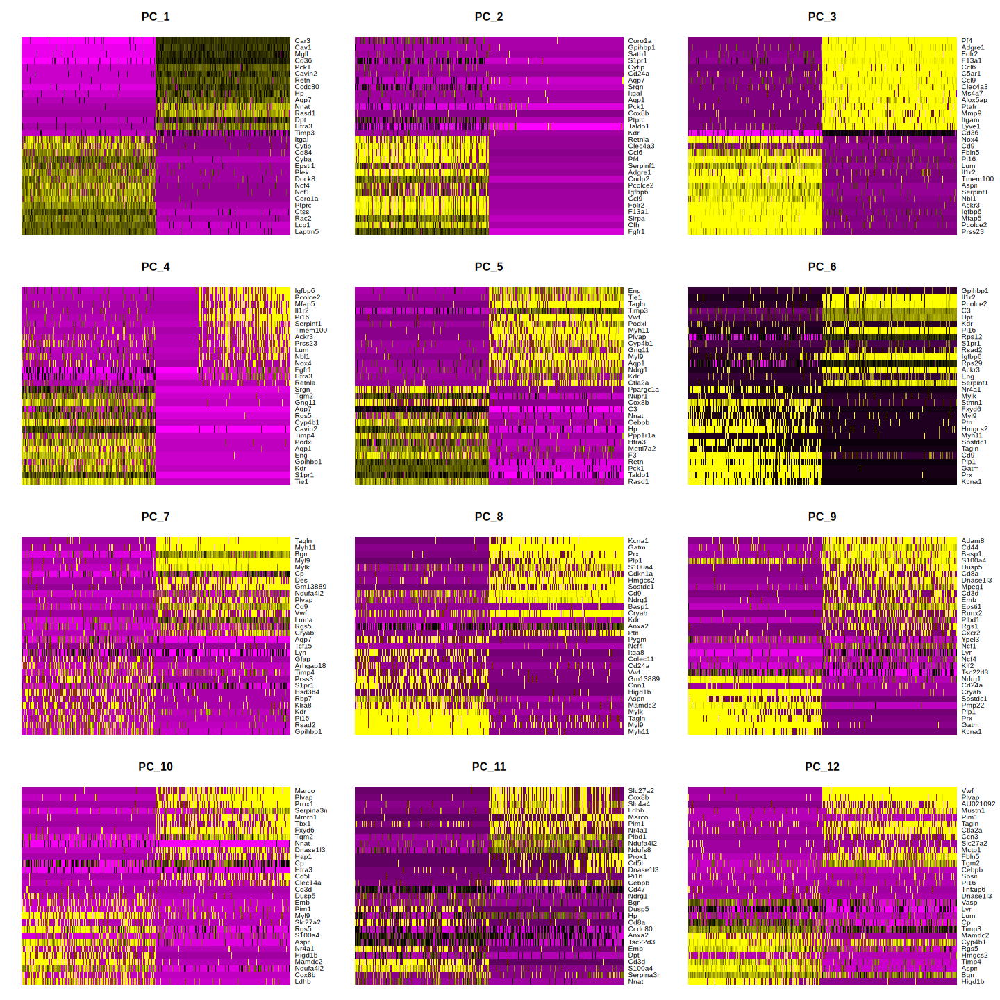

In [28]:
DimHeatmap(
  region_spatial,
  dims = 1:12,
  cells = 1000,
  balanced = TRUE
)

PC1–PC12 are carrying structured, coherent biological programs rather than diffuse noise!

In [29]:
region_spatial <- FindNeighbors(
  region_spatial,
  reduction = "pca",
  dims = dims_use,
  k.param = 20,
  graph.name = c(
    "Xenium_nn_PC12",
    "Xenium_snn_PC12"
  ),
  verbose = FALSE
)

In [30]:
region_spatial <- RunUMAP(
  region_spatial,
  reduction = "pca",
  dims = dims_use,
  reduction.name = "umap_PC12",
  seed.use = 1234,
  verbose = FALSE
)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [31]:
resolutions <- c(
  0.7,
  0.8,
  1.0,
  1.2
)

for (res in resolutions) {
  print(res)
  region_spatial <- FindClusters(
    region_spatial,
    graph.name = "Xenium_snn_PC12",
    algorithm = 4,
    resolution = res,
    cluster.name = paste0(
      "cluster_res_",
      gsub("\\.", "_", res)
    ),
    random.seed = 1234,
    verbose = FALSE
  )
}

[1] 0.7
[1] 0.8
[1] 1
[1] 1.2


In [32]:
options(repr.plot.width=12, repr.plot.height=8)

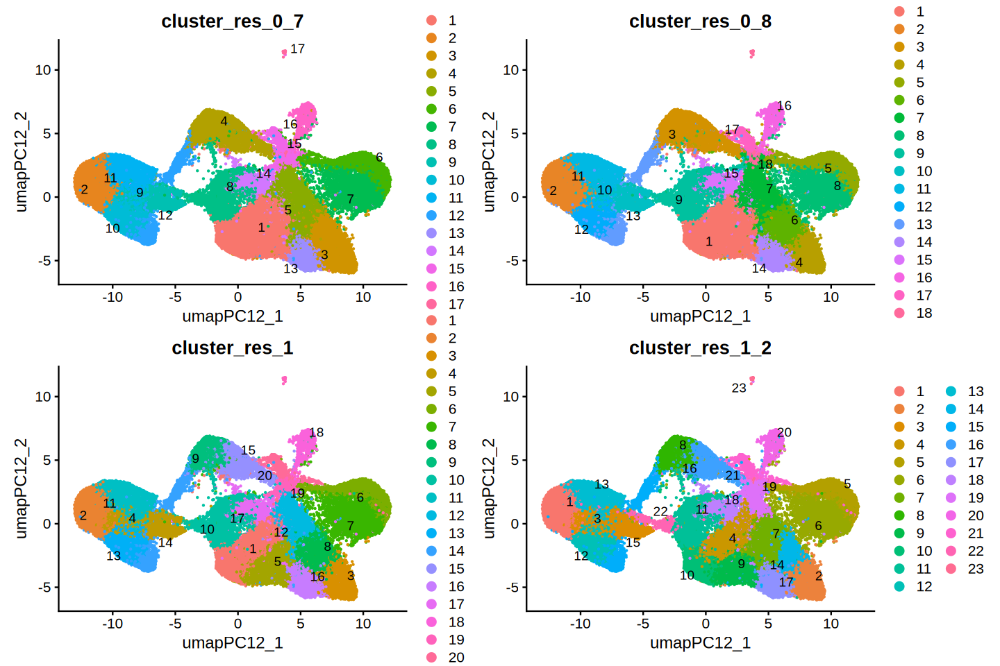

In [33]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c(
    "cluster_res_0_7",
    "cluster_res_0_8",
    "cluster_res_1",
    "cluster_res_1_2"
  ),
  label = TRUE,
  repel = TRUE,
  ncol = 2
)

In [34]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

### Cell Type Annotataion M1 - By clustering scores

Try resolution 1.2

In [35]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [36]:
marker_df <- tibble::tribble(
  ~Gene_Symbol, ~CellType_main, ~CellType_subtype,

  "Gpihbp1", "Endothelial", "Capillary_EC",
  "Kdr",     "Endothelial", "Capillary_EC",

  "Vwf",     "Endothelial", "Venous_EC",
  "Plvap",   "Endothelial", "Venous_EC",

  "Mmrn1",   "Endothelial", "Lymphatic_EC",
  "Prox1",   "Endothelial", "Lymphatic_EC",
  "Lyve1",   "Endothelial", "Lymphatic_EC",

  "Pck1",    "Adipocyte", "Adipocyte",
  "Retn",    "Adipocyte", "Adipocyte",
  "Aqp7",    "Adipocyte", "Adipocyte",
  "Ppargc1a","Adipocyte", "Adipocyte",
  "Car3",    "Adipocyte", "Adipocyte",
  "Cd36",    "Adipocyte", "Adipocyte",

  "Pi16",    "Stromal_Fibroblast", "ASC",
  "Pcolce2", "Stromal_Fibroblast", "ASC",
  "Mfap5",   "Stromal_Fibroblast", "ASC",

  "Lum",     "Stromal_Fibroblast", "Fibroblast",
  "Serpinf1","Stromal_Fibroblast", "Fibroblast",
  "Bgn",     "Stromal_Fibroblast", "Fibroblast",
  "Dpt",     "Stromal_Fibroblast", "Fibroblast",
  "Aspn",    "Stromal_Fibroblast", "Fibroblast",
  "Ccdc80",  "Stromal_Fibroblast", "Fibroblast",

  "Tagln",   "Mural", "VSMC",
  "Myh11",   "Mural", "VSMC",
  "Cnn1",    "Mural", "VSMC",
  "Itga8",   "Mural", "VSMC",
  "Myl9",    "Mural", "VSMC",
  "Mylk",    "Mural", "VSMC",

  "Rgs5",    "Mural", "Pericyte",
  "Higd1b",  "Mural", "Pericyte",
  "Ndufa4l2","Mural", "Pericyte",
  "Myl9",    "Mural", "Pericyte",
  "Des",     "Mural", "Pericyte",
  "Timp3",   "Mural", "Pericyte",

  "Plp1",    "Neural", "Schwann",
  "Prx",     "Neural", "Schwann",
  "Pmp22",   "Neural", "Schwann",
  "Kcna1",   "Neural", "Schwann",
  "Chl1",    "Neural", "Schwann",

  "Pf4",     "Macrophage", "LYVE_macrophage",
  "Folr2",   "Macrophage", "LYVE_macrophage",
  "F13a1",   "Macrophage", "LYVE_macrophage",
  "C5ar1",   "Macrophage", "LYVE_macrophage",
  "Adgre1",  "Macrophage", "LYVE_macrophage",
  "Retnla",  "Macrophage", "LYVE_macrophage",
  "Lyve1",   "Macrophage", "LYVE_macrophage",
  "Ms4a7",   "Macrophage", "LYVE_macrophage",
  "Ccl6",    "Macrophage", "LYVE_macrophage",

  "Marco",   "Macrophage", "Scavenging_macrophage",
  "Mpeg1",   "Macrophage", "Scavenging_macrophage",
  "Cd5l",    "Macrophage", "Scavenging_macrophage",
  "Ms4a6c",  "Macrophage", "Scavenging_macrophage",
  "Lst1",    "Macrophage", "Scavenging_macrophage",

  "Cebpb",   "Monocyte", "Monocyte",
  "Ctss",    "Monocyte", "Monocyte",
  "Cd300a",  "Monocyte", "Monocyte",
  "Cybb",    "Monocyte", "Monocyte",

  "Csf3r",   "Neutrophil", "Neutrophil",
  "Cxcr2",   "Neutrophil", "Neutrophil",
  "Mmp9",    "Neutrophil", "Neutrophil",
  "Ctsg",    "Neutrophil", "Neutrophil",

  "Mrgpra2a",    "Mast cell", "MC",
  "Il1rl1",  "Mast cell", "MC",
  "Stfa2l1",  "Mast cell", "MC",
  "Cstdc4",  "Mast cell", "MC",
  "Asprv1",  "Mast cell", "MC",

  "Alox15",  "Eosinophil", "Eosinophil",
  "Siglecf", "Eosinophil", "Eosinophil",
  "Ccr3",    "Eosinophil", "Eosinophil",
  "Il5ra",   "Eosinophil", "Eosinophil",
  "Prg2",    "Eosinophil", "Eosinophil",
  "Ear1",    "Eosinophil", "Eosinophil",
  "Ear2",    "Eosinophil", "Eosinophil",

  "Cd3d",    "T cell", "T cell",
  "Cd8a",    "T cell", "T cell",
  "Ctla4",   "T cell", "T cell",
  "Epsti1",  "T cell", "T cell",

  "Itgal",   "NK", "NK",
  "Klra8",   "NK", "NK",

  "Basp1",   "DC", "DC",
  "Cytip",   "DC", "DC",
  "Adam8",   "DC", "DC",
  "Rab8b",   "DC", "DC",
  "Runx2",   "DC", "DC",

  "Plbd1",   "DC", "cDC",
  "Cd24a",   "DC", "cDC",
  "Psmb8",   "DC", "cDC",

    # leave B out as they are not good canonical markers 
  # "Slc25a37", "B cell", "B cell",
  # "Slc4a1", "B cell", "B cell",
  # "Cpa3", "B cell", "B cell",
 
  "Krt19",   "Mesothelial", "Mesothelial",
  "Cav1",    "Mesothelial", "Mesothelial",
  "Igfbp6",  "Mesothelial", "Mesothelial"
)
    
marker_df_use <- marker_df %>%
  filter(Gene_Symbol %in% rownames(region_spatial)) %>%
  distinct(Gene_Symbol, CellType_main, CellType_subtype)

In [37]:
table(marker_df_use$CellType_main)


         Adipocyte                 DC        Endothelial         Eosinophil 
                 6                  8                  7                  7 
        Macrophage          Mast cell        Mesothelial           Monocyte 
                14                  5                  3                  4 
             Mural             Neural         Neutrophil                 NK 
                12                  5                  4                  2 
Stromal_Fibroblast             T cell 
                 9                  4 

In [38]:
marker_coverage <- marker_df %>%
  mutate(Present = Gene_Symbol %in% rownames(region_spatial)) %>%
  group_by(CellType_main, CellType_subtype) %>%
  summarise(
    n_markers = n(),
    n_present = sum(Present),
    coverage = n_present / n_markers,
    genes_present = paste(Gene_Symbol[Present], collapse = ", "),
    .groups = "drop"
  ) %>%
  arrange(CellType_main, CellType_subtype)

marker_coverage

CellType_main,CellType_subtype,n_markers,n_present,coverage,genes_present
<chr>,<chr>,<int>,<int>,<dbl>,<chr>
Adipocyte,Adipocyte,6,6,1,"Pck1, Retn, Aqp7, Ppargc1a, Car3, Cd36"
DC,DC,5,5,1,"Basp1, Cytip, Adam8, Rab8b, Runx2"
DC,cDC,3,3,1,"Plbd1, Cd24a, Psmb8"
Endothelial,Capillary_EC,2,2,1,"Gpihbp1, Kdr"
Endothelial,Lymphatic_EC,3,3,1,"Mmrn1, Prox1, Lyve1"
Endothelial,Venous_EC,2,2,1,"Vwf, Plvap"
Eosinophil,Eosinophil,7,7,1,"Alox15, Siglecf, Ccr3, Il5ra, Prg2, Ear1, Ear2"
Macrophage,LYVE_macrophage,9,9,1,"Pf4, Folr2, F13a1, C5ar1, Adgre1, Retnla, Lyve1, Ms4a7, Ccl6"
Macrophage,Scavenging_macrophage,5,5,1,"Marco, Mpeg1, Cd5l, Ms4a6c, Lst1"


In [39]:
main_result <- score_marker_groups_by_cluster(
  object = region_spatial,
  marker_df = marker_df_use,
  group_col = "CellType_main",
  cluster_col = "cluster_res_1_2",
  assay = "Xenium",
  layer = "data",
  score_prefix = "MainScore",
  detect_prefix = "MainDetect",
  label_prefix = "Main"
)

region_spatial <- main_result$object

subtype_result <- score_marker_groups_by_cluster(
  object = region_spatial,
  marker_df = marker_df_use,
  group_col = "CellType_subtype",
  cluster_col = "cluster_res_1_2",
  assay = "Xenium",
  layer = "data",
  score_prefix = "SubtypeScore",
  detect_prefix = "SubtypeDetect",
  label_prefix = "Subtype"
)

region_spatial <- subtype_result$object

main_result$annotation
subtype_result$annotation

cluster_res_1_2,Main_label,Main_score,Main_second,Main_second_score,Main_margin
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,NK,0.44066024,Monocyte,0.28460684,0.156053403
2,Adipocyte,1.04048510,Mesothelial,0.25418666,0.786298438
3,Monocyte,0.37708247,DC,0.37494254,0.002139932
4,Adipocyte,0.53642703,Endothelial,0.30957480,0.226852226
5,Stromal_Fibroblast,1.59373139,Mesothelial,0.54247348,1.051257914
6,Stromal_Fibroblast,1.23447876,Mesothelial,0.66807365,0.566405113
7,Adipocyte,0.73802374,Mesothelial,0.06537578,0.672647962
8,Macrophage,1.77298484,Monocyte,1.13669228,0.636292559
9,Adipocyte,0.84466964,Endothelial,0.35494058,0.489729060


cluster_res_1_2,Subtype_label,Subtype_score,Subtype_second,Subtype_second_score,Subtype_margin
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,cDC,0.55161961,NK,0.44066024,0.110959367
2,Adipocyte,1.04048510,Fibroblast,0.25904705,0.781438051
3,Scavenging_macrophage,0.57587331,cDC,0.56524143,0.010631883
4,Capillary_EC,1.32851486,Adipocyte,0.53642703,0.792087830
5,ASC,2.47616588,Fibroblast,1.15251415,1.323651733
6,Fibroblast,1.45006387,ASC,0.80330855,0.646755323
7,Adipocyte,0.73802374,Mesothelial,0.06537578,0.672647962
8,LYVE_macrophage,2.33549548,Monocyte,1.13669228,1.198803203
9,Capillary_EC,1.41058827,Adipocyte,0.84466964,0.565918630


In [40]:
subtype_to_main <- marker_df_use %>%
  transmute(
    CellType_subtype = as.character(CellType_subtype),
    CellType_main = as.character(CellType_main),
    subtype_key = make.names(CellType_subtype)
  ) %>%
  distinct()

xenium_cluster_annotation <- subtype_result$annotation %>%
  mutate(
    subtype_key = make.names(as.character(Subtype_label))
  ) %>%
  rename(
    Xenium_cluster_subtype_score = Subtype_score,
    Xenium_cluster_subtype_second = Subtype_second,
    Xenium_cluster_subtype_second_score = Subtype_second_score,
    Xenium_cluster_subtype_margin = Subtype_margin
  ) %>%
  left_join(
    subtype_to_main,
    by = "subtype_key"
  ) %>%
  mutate(
    Xenium_cluster_subtype = CellType_subtype
  ) %>%
  select(
    -subtype_key,
    -CellType_subtype,
    -Subtype_label
  ) %>%
  rename(
    Xenium_cluster_main = CellType_main
  ) %>%
  left_join(
    main_result$annotation %>%
      transmute(
        cluster_res_1_2,
        Xenium_main_score_label = as.character(Main_label),
        Xenium_main_score = Main_score,
        Xenium_main_second = as.character(Main_second),
        Xenium_main_second_score = Main_second_score,
        Xenium_main_margin = Main_margin
      ),
    by = "cluster_res_1_2"
  )

In [41]:
xenium_cluster_annotation

cluster_res_1_2,Xenium_cluster_subtype_score,Xenium_cluster_subtype_second,Xenium_cluster_subtype_second_score,Xenium_cluster_subtype_margin,Xenium_cluster_main,Xenium_cluster_subtype,Xenium_main_score_label,Xenium_main_score,Xenium_main_second,Xenium_main_second_score,Xenium_main_margin
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,0.55161961,NK,0.44066024,0.110959367,DC,cDC,NK,0.44066024,Monocyte,0.28460684,0.156053403
2,1.04048510,Fibroblast,0.25904705,0.781438051,Adipocyte,Adipocyte,Adipocyte,1.04048510,Mesothelial,0.25418666,0.786298438
3,0.57587331,cDC,0.56524143,0.010631883,Macrophage,Scavenging_macrophage,Monocyte,0.37708247,DC,0.37494254,0.002139932
4,1.32851486,Adipocyte,0.53642703,0.792087830,Endothelial,Capillary_EC,Adipocyte,0.53642703,Endothelial,0.30957480,0.226852226
5,2.47616588,Fibroblast,1.15251415,1.323651733,Stromal_Fibroblast,ASC,Stromal_Fibroblast,1.59373139,Mesothelial,0.54247348,1.051257914
6,1.45006387,ASC,0.80330855,0.646755323,Stromal_Fibroblast,Fibroblast,Stromal_Fibroblast,1.23447876,Mesothelial,0.66807365,0.566405113
7,0.73802374,Mesothelial,0.06537578,0.672647962,Adipocyte,Adipocyte,Adipocyte,0.73802374,Mesothelial,0.06537578,0.672647962
8,2.33549548,Monocyte,1.13669228,1.198803203,Macrophage,LYVE_macrophage,Macrophage,1.77298484,Monocyte,1.13669228,0.636292559
9,1.41058827,Adipocyte,0.84466964,0.565918630,Endothelial,Capillary_EC,Adipocyte,0.84466964,Endothelial,0.35494058,0.489729060


In [42]:
# Safely attach cluster-level Xenium evidence to every cell.
# Remove prior versions of these columns before joining.

xenium_cols <- setdiff(
  colnames(xenium_cluster_annotation),
  "cluster_res_1_2"
)

region_spatial@meta.data <- region_spatial@meta.data %>%
  select(-any_of(xenium_cols))

meta_tmp <- region_spatial@meta.data %>%
  rownames_to_column("seurat_cell") %>%
  mutate(cluster_res_1_2 = as.character(cluster_res_1_2)) %>%
  left_join(
    xenium_cluster_annotation %>%
      mutate(cluster_res_1_2 = as.character(cluster_res_1_2)),
    by = "cluster_res_1_2"
  ) %>%
  column_to_rownames("seurat_cell")

stopifnot(
  identical(rownames(meta_tmp), colnames(region_spatial))
)

region_spatial@meta.data <- meta_tmp

In [43]:
colnames(region_spatial@meta.data )

[1] "orig.ident"                               
  [2] "nCount_Xenium"                            
  [3] "nFeature_Xenium"                          
  [4] "cell_id"                                  
  [5] "x_centroid"                               
  [6] "y_centroid"                               
  [7] "transcript_counts"                        
  [8] "control_probe_counts"                     
  [9] "genomic_control_counts"                   
 [10] "control_codeword_counts"                  
 [11] "unassigned_codeword_counts"               
 [12] "deprecated_codeword_counts"               
 [13] "total_counts"                             
 [14] "cell_area"                                
 [15] "nucleus_area"                             
 [16] "nucleus_count"                            
 [17] "segmentation_method"                      
 [18] "region_id"                                
 [19] "control_fraction_cell"                    
 [20] "nucleus_missing_flag"                     
 [21] "multiple_nuclei_flag"                     
 [22] "cell_area_outlier_flag"                   
 [23] "high_control_flag"                        
 [24] "segmentation_multiplet_flag"              
 [25] "qc_core_pass"                             
 [26] "qc_review_flag"                           
 [27] "mouse_id"                                 
 [28] "section_id"                               
 [29] "biological_replicate_id"                  
 [30] "genotype"                                 
 [31] "treatment"                                
 [32] "condition"                                
 [33] "age_weeks"                                
 [34] "metadata_status"                          
 [35] "do_not_interpret"                         
 [36] "grid_x"                                   
 [37] "grid_y"                                   
 [38] "grid_id"                                  
 [39] "edge_proxy"                               
 [40] "grid_size_um"                             
 [41] "local_density"                            
 [42] "dense_aggregate"                          
 [43] "primary_include"                          
 [44] "strict_include"                           
 [45] "hotspot_review_cell"                      
 [46] "hotspot_sensitivity_include"              
 [47] "section_status"                           
 [48] "mask_rule_primary"                        
 [49] "mask_rule_strict"                         
 [50] "mask_rule_hotspot_sensitivity"            
 [51] "provenance"                               
 [52] "run_label"                                
 [53] "execution_mode"                           
 [54] "generated_utc"                            
 [55] "source_artifact"                          
 [56] "section_input_cells"                      
 [57] "section_primary_include_cells"            
 [58] "section_strict_include_cells"             
 [59] "section_hotspot_sensitivity_include_cells"
 [60] "qc_threshold_source"                      
 [61] "cluster_res_0_7"                          
 [62] "seurat_clusters"                          
 [63] "cluster_res_0_8"                          
 [64] "cluster_res_1"                            
 [65] "cluster_res_1_2"                          
 [66] "MainScore_Endothelial"                    
 [67] "MainScore_Adipocyte"                      
 [68] "MainScore_Stromal_Fibroblast"             
 [69] "MainScore_Mural"                          
 [70] "MainScore_Neural"                         
 [71] "MainScore_Macrophage"                     
 [72] "MainScore_Monocyte"                       
 [73] "MainScore_Neutrophil"                     
 [74] "MainScore_Mast.cell"                      
 [75] "MainScore_Eosinophil"                     
 [76] "MainScore_T.cell"                         
 [77] "MainScore_NK"                             
 [78] "MainScore_DC"                             
 [79] "MainScore_Mesothelial"                    
 [80] "MainDetect_Endothelial"                   
 [

In [260]:
options(repr.plot.width=16, repr.plot.height=6)

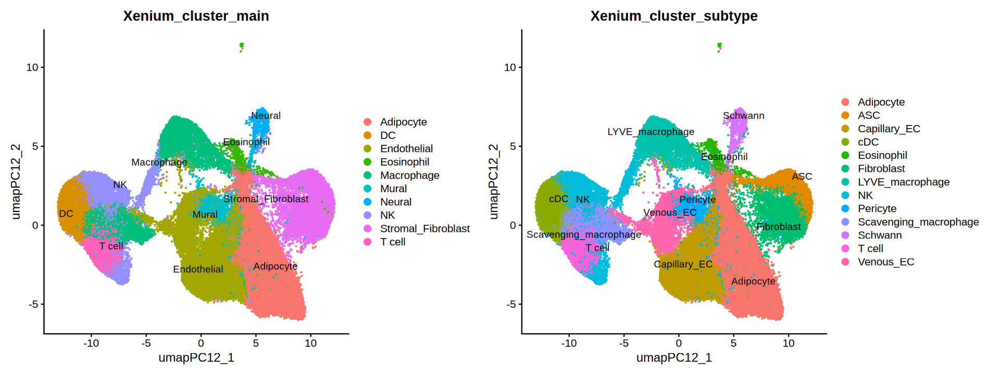

In [45]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("Xenium_cluster_main", "Xenium_cluster_subtype"),
  label = TRUE,
  repel = TRUE
)

In [263]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "cell_id"                                                   
  [5] "x_centroid"                                                
  [6] "y_centroid"                                                
  [7] "transcript_counts"                                         
  [8] "control_probe_counts"                                      
  [9] "genomic_control_counts"                                    
 [10] "control_codeword_counts"                                   
 [11] "unassigned_codeword_counts"                                
 [12] "deprecated_codeword_counts"                                
 [13] "total_counts"                                              
 [14] "cell_area"                                                 
 [15] "nucleus_area"                                              
 [16] "nucleus_count"                                             
 [17] "segmentation_method"                                       
 [18] "region_id"                                                 
 [19] "control_fraction_cell"                                     
 [20] "nucleus_missing_flag"                                      
 [21] "multiple_nuclei_flag"                                      
 [22] "cell_area_outlier_flag"                                    
 [23] "high_control_flag"                                         
 [24] "segmentation_multiplet_flag"                               
 [25] "qc_core_pass"                                              
 [26] "qc_review_flag"                                            
 [27] "mouse_id"                                                  
 [28] "section_id"                                                
 [29] "biological_replicate_id"                                   
 [30] "genotype"                                                  
 [31] "treatment"                                                 
 [32] "condition"                                                 
 [33] "age_weeks"                                                 
 [34] "metadata_status"                                           
 [35] "do_not_interpret"                                          
 [36] "grid_x"                                                    
 [37] "grid_y"                                                    
 [38] "grid_id"                                                   
 [39] "edge_proxy"                                                
 [40] "grid_size_um"                                              
 [41] "local_density"                                             
 [42] "dense_aggregate"                                           
 [43] "primary_include"                                           
 [44] "strict_include"                                            
 [45] "hotspot_review_cell"                                       
 [46] "hotspot_sensitivity_include"                               
 [47] "section_status"                                            
 [48] "mask_rule_primary"                                         
 [49] "mask_rule_strict"                                          
 [50] "mask_rule_hotspot_sensitivity"                             
 [51] "provenance"                                                
 [52] "run_label"                                                 
 [53] "execution_mode"                                            
 [54] "generated_utc"                                             
 [55] "source_artifact"                                           
 [56] "section_input_cells"                                       
 [57] "section_primary_include_cells"                             
 [58] "section_strict_include_cells"                              
 [59] "section_hotspot_sensitivity_include_cells"                 
 [60] "qc_threshold_source"                      

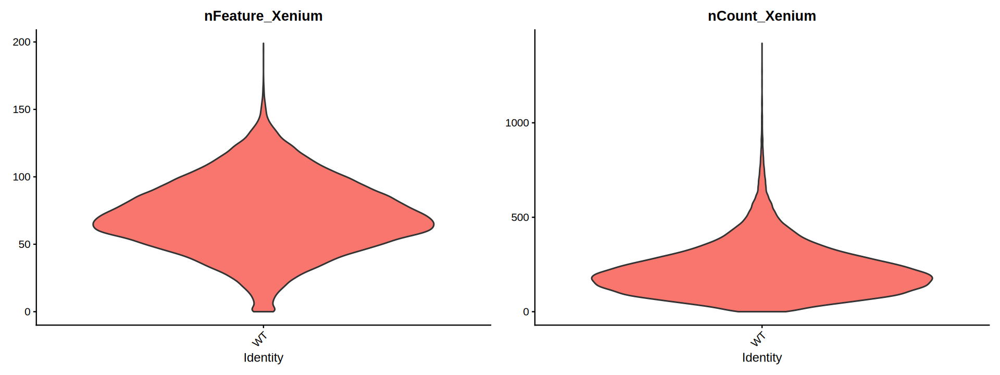

In [264]:
VlnPlot(region_spatial, features=c(
    "nFeature_Xenium",
    "nCount_Xenium"
  ), group.by='genotype', ncol=2, pt.size=0)

Should QC
- nFeature_Xenium > 5 & nFeature_Xenium < 200 &
- nCount_Xenium > 10 & nCount_Xenium < 1000

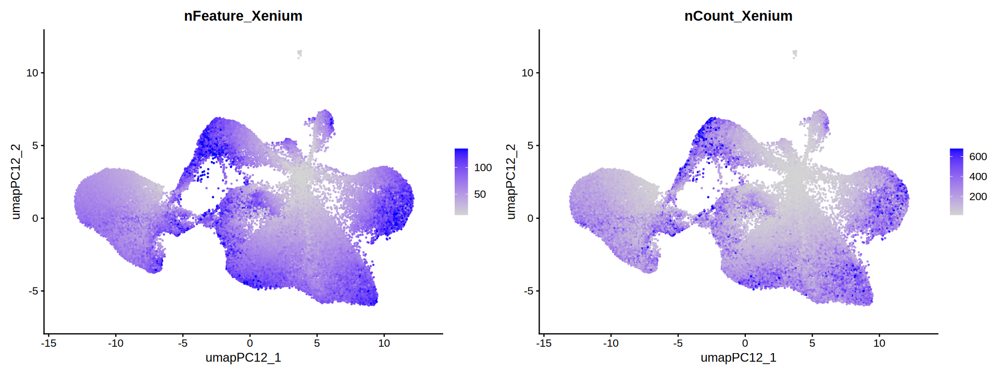

In [261]:
p_qc <- FeaturePlot(
  region_spatial,
  features = c(
    "nFeature_Xenium",
    "nCount_Xenium"
  ),
  reduction = "umap_PC12",
  min.cutoff = "q01",
  max.cutoff = "q99",
  ncol = 2
)

p_qc

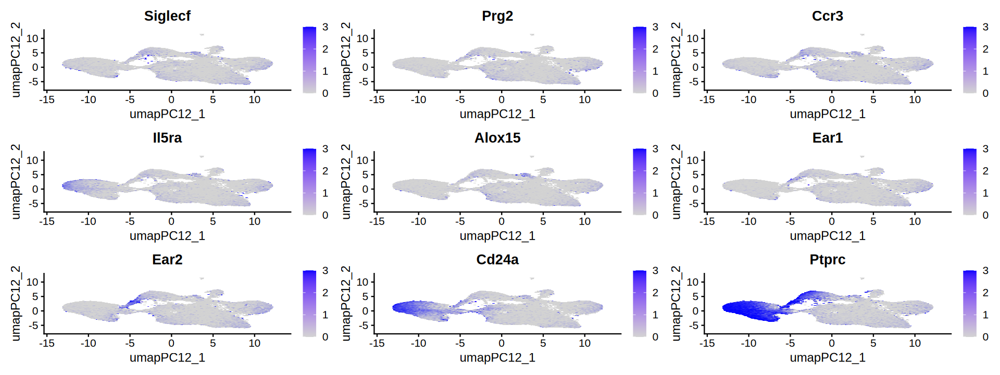

In [46]:
FeaturePlot(
    region_spatial,
    features = c(
        "Siglecf", "Prg2", "Ccr3",
        "Il5ra", "Alox15",
        "Ear1", "Ear2", "Cd24a", "Ptprc"
    ),
    reduction = "umap_PC12",
    raster = TRUE, 
    pt.size = 3, 
    max.cutoff = 3
)

In [47]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

### Cell Type Annotation M2 - By Reference

In [48]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [49]:
WANG_REFERENCE_PATH <- file.path(
  "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data",
  "Wang_Science2025_mouse_human",
  "analysis_mouse",
  "Wang_Science2025_cleaned_seurat.rds"
)

In [51]:
scwat_ref <- readRDS(WANG_REFERENCE_PATH)
DefaultAssay(scwat_ref) <- "RNA"

cat("Reference conditions:\n")
print(table(scwat_ref$Condition))

Reference conditions:

2.5 months  12 months 
     19252      21686 


In [52]:
scwat_ref$Wang_subtype_original <- as.character(
  scwat_ref$CellType_subtype
)

sort(unique(scwat_ref$Wang_subtype_original))

[1] "Arterial_EC"                "ASC"                       
 [3] "B"                          "Capillary_EC"              
 [5] "CCR2_inflammatory_Monocyte" "CCR7_migratory_DC"         
 [7] "cDC1"                       "cDC2"                      
 [9] "CP-1"                       "CP-2"                      
[11] "CP-A"                       "CX3CR1_Monocyte"           
[13] "Eosinophil"                 "Epithelial"                
[15] "IAP"                        "ILC2"                      
[17] "Inflammatory_Mac"           "LYVE1_resident_Mac"        
[19] "Mast cell"                  "MatureAdip"                
[21] "Mesothelial"                "Neutrophil"                
[23] "NK"                         "Pericyte"                  
[25] "Plasma"                     "RegFibro"                  
[27] "T"                          "TREM2_LAM"                 
[29] "γδ T"

In [53]:
# Explicit Wang subtype harmonization.
# Detailed immune labels are preserved.
# Closely related non-immune states are harmonized only for broad-lineage transfer.

wang_subtype_harmonization <- c(
  "ASC" = "ASC",
  "IAP" = "APC",
  "CP-1" = "APC",
  "CP-A" = "APC",
  "CP-2" = "APC",
  "RegFibro" = "APC",
  "MatureAdip" = "Adipocyte",
  "Pericyte" = "Mural",
  "Arterial_EC" = "Endothelial",
  "Capillary_EC" = "Endothelial",
  "Epithelial" = "Epithelial",
  "Mesothelial" = "Mesothelial",
  "T" = "T",
  "γδ T" = "γδ T",
  "NK" = "NK",
  "ILC2" = "ILC2",
  "B" = "B",
  "Plasma" = "Plasma",
  "CCR2_inflammatory_Monocyte" = "CCR2_inflammatory_Monocyte",
  "CX3CR1_Monocyte" = "CX3CR1_Monocyte",
  "Inflammatory_Mac" = "Inflammatory_Mac",
  "LYVE1_resident_Mac" = "LYVE1_resident_Mac",
  "TREM2_LAM" = "TREM2_LAM",
  "IFN_response_myeloid" = "IFN_response_myeloid",
  "cDC1" = "cDC1",
  "cDC2" = "cDC2",
  "CCR7_migratory_DC" = "CCR7_migratory_DC",
  "Neutrophil" = "Neutrophil",
  "Eosinophil" = "Eosinophil",
  "Mast cell" = "Mast cell"
)

unexpected_wang_labels <- setdiff(
  unique(scwat_ref$Wang_subtype_original),
  names(wang_subtype_harmonization)
)

if (length(unexpected_wang_labels)) {
  stop(
    "Unexpected Wang subtype labels. Review before proceeding: ",
    paste(unexpected_wang_labels, collapse = ", ")
  )
}

scwat_ref$Wang_subtype_harmonized <- unname(
  wang_subtype_harmonization[
    scwat_ref$Wang_subtype_original
  ]
)


In [54]:
scwat_ref$Wang_main <- case_when(
  scwat_ref$Wang_subtype_harmonized %in% c("ASC", "APC") ~ "Stromal_Fibroblast",
  scwat_ref$Wang_subtype_harmonized == "Mural" ~ "Mural",
  scwat_ref$Wang_subtype_harmonized == "Adipocyte" ~ "Adipocyte",
  scwat_ref$Wang_subtype_harmonized == "Endothelial" ~ "Endothelial",
  scwat_ref$Wang_subtype_harmonized == "Epithelial" ~ "Epithelial",
  scwat_ref$Wang_subtype_harmonized == "Mesothelial" ~ "Mesothelial",

  scwat_ref$Wang_subtype_harmonized %in% c("T", "γδ T") ~ "T cell",
  scwat_ref$Wang_subtype_harmonized == "NK" ~ "NK",
  scwat_ref$Wang_subtype_harmonized == "ILC2" ~ "ILC",
  scwat_ref$Wang_subtype_harmonized == "B" ~ "B cell",
  scwat_ref$Wang_subtype_harmonized == "Plasma" ~ "Plasma",

  scwat_ref$Wang_subtype_harmonized %in%
    c("CCR2_inflammatory_Monocyte", "CX3CR1_Monocyte") ~ "Monocyte",

  scwat_ref$Wang_subtype_harmonized %in%
    c("Inflammatory_Mac", "LYVE1_resident_Mac", "TREM2_LAM") ~ "Macrophage",

  scwat_ref$Wang_subtype_harmonized == "IFN_response_myeloid" ~ "Myeloid",

  scwat_ref$Wang_subtype_harmonized %in%
    c("cDC1", "cDC2", "CCR7_migratory_DC") ~ "DC",

  scwat_ref$Wang_subtype_harmonized == "Neutrophil" ~ "Neutrophil",
  scwat_ref$Wang_subtype_harmonized == "Eosinophil" ~ "Eosinophil",
  scwat_ref$Wang_subtype_harmonized == "Mast cell" ~ "Mast cell",

  TRUE ~ NA_character_
)

if (anyNA(scwat_ref$Wang_main)) {
  stop("Some Wang cells could not be mapped to the broad ontology.")
}

table(
  scwat_ref$Wang_main,
  scwat_ref$Wang_subtype_harmonized
)


                    
                     Adipocyte   APC   ASC     B CCR2_inflammatory_Monocyte
  Adipocyte                 40     0     0     0                          0
  B cell                     0     0     0  1241                          0
  DC                         0     0     0     0                          0
  Endothelial                0     0     0     0                          0
  Eosinophil                 0     0     0     0                          0
  Epithelial                 0     0     0     0                          0
  ILC                        0     0     0     0                          0
  Macrophage                 0     0     0     0                          0
  Mast cell                  0     0     0     0                          0
  Mesothelial                0     0     0     0                          0
  Monocyte                   0     0     0     0                       1256
  Mural                      0     0     0     0                   

In [55]:
# saveRDS(scwat_ref,WANG_REFERENCE_PATH)

In [57]:
annotation_genes <- Reduce(
  intersect,
  list(
    FIX_GENESET,
    rownames(scwat_ref),
    rownames(region_spatial)
  )
)

cat("Annotation features:", length(annotation_genes), "\n")

if (length(annotation_genes) < 100) {
  stop("Too few shared identity genes for reliable transfer; review gene symbols/panel.")
}

# # Confirm short-/long-lived Eos state genes are excluded.
# stopifnot(
#   length(intersect(annotation_genes, eos_state_genes)) == 0
# )

Annotation features: 467 


In [58]:
run_wang_transfer <- function(
  reference,
  query,
  annotation_genes,
  main_col = "Wang_main",
  subtype_col = "Wang_subtype_harmonized",
  prefix
) {

  DefaultAssay(reference) <- "RNA"

  # Restrict features to genes present in BOTH objects
  features_use <- Reduce(
    intersect,
    list(
      annotation_genes,
      rownames(reference),
      rownames(query)
    )
  )

  message(
    prefix,
    ": using ",
    length(features_use),
    " shared annotation genes"
  )

  reference <- NormalizeData(
    reference,
    assay = "RNA",
    verbose = FALSE
  )

  reference <- ScaleData(
    reference,
    assay = "RNA",
    features = features_use,
    verbose = FALSE
  )

  reference <- RunPCA(
    reference,
    assay = "RNA",
    features = features_use,
    npcs = 30,
    seed.use = 1234,
    verbose = FALSE
  )

  anchors <- FindTransferAnchors(
    reference = reference,
    query = query,
    reference.assay = "RNA",
    query.assay = "Xenium",
    normalization.method = "LogNormalize",
    reduction = "pcaproject",
    features = features_use,
    dims = 1:30,
    verbose = FALSE
  )

  pred_main <- TransferData(
    anchorset = anchors,
    refdata = reference[[main_col]][, 1],
    dims = 1:30,
    verbose = FALSE
  )

  pred_subtype <- TransferData(
    anchorset = anchors,
    refdata = reference[[subtype_col]][, 1],
    dims = 1:30,
    verbose = FALSE
  )

  # Rename output columns so 2.5m / 12m / all can coexist
  colnames(pred_main) <- paste0(
    prefix,
    "_main_",
    colnames(pred_main)
  )

  colnames(pred_subtype) <- paste0(
    prefix,
    "_subtype_",
    colnames(pred_subtype)
  )

  list(
    main = pred_main,
    subtype = pred_subtype,
    anchors = anchors,
    features = features_use
  )
}

In [59]:
ref_2p5 <- subset(
  scwat_ref,
  subset = Condition == "2.5 months"
)

ref_12 <- subset(
  scwat_ref,
  subset = Condition == "12 months"
)

ref_all <- scwat_ref

In [60]:
table(
  ref_2p5$Wang_subtype_harmonized
)

table(
  ref_12$Wang_subtype_harmonized
)

table(
  ref_all$Wang_subtype_harmonized
)


                 Adipocyte                        APC 
                        31                       6125 
                       ASC                          B 
                      1524                        715 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       653                         39 
                      cDC1                       cDC2 
                       465                        158 
           CX3CR1_Monocyte                Endothelial 
                       181                        917 
                Eosinophil                 Epithelial 
                        19                        413 
                      ILC2           Inflammatory_Mac 
                       473                        357 
        LYVE1_resident_Mac                  Mast cell 
                      3200                         28 
               Mesothelial                      Mural 
                       550                        827 
         


                 Adipocyte                        APC 
                         9                       8115 
                       ASC                          B 
                      4525                        526 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       603                         74 
                      cDC1                       cDC2 
                       380                         89 
           CX3CR1_Monocyte                Endothelial 
                       389                        402 
                Eosinophil                 Epithelial 
                       161                        212 
                      ILC2           Inflammatory_Mac 
                       278                        271 
        LYVE1_resident_Mac                  Mast cell 
                      1892                         24 
               Mesothelial                      Mural 
                      1306                        801 
         


                 Adipocyte                        APC 
                        40                      14240 
                       ASC                          B 
                      6049                       1241 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                      1256                        113 
                      cDC1                       cDC2 
                       845                        247 
           CX3CR1_Monocyte                Endothelial 
                       570                       1319 
                Eosinophil                 Epithelial 
                       180                        625 
                      ILC2           Inflammatory_Mac 
                       751                        628 
        LYVE1_resident_Mac                  Mast cell 
                      5092                         52 
               Mesothelial                      Mural 
                      1856                       1628 
         

In [61]:
length(annotation_genes)

[1] 467

In [62]:
transfer_2p5 <- run_wang_transfer(
  reference = ref_2p5,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "Ref2p5"
)

transfer_12 <- run_wang_transfer(
  reference = ref_12,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "Ref12"
)

transfer_all <- run_wang_transfer(
  reference = ref_all,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "RefAll"
)

Ref2p5: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”
Ref12: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”
RefAll: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”


In [63]:
region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_2p5$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_2p5$subtype
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_12$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_12$subtype
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_all$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_all$subtype
)

In [64]:
table(
  region_spatial$RefAll_subtype_predicted.id
)


                 Adipocyte                        APC 
                     14699                       8381 
                       ASC                          B 
                      3593                      10675 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       743                        554 
                      cDC1                       cDC2 
                      1242                       2671 
           CX3CR1_Monocyte                Endothelial 
                      1031                      15024 
                Eosinophil                 Epithelial 
                        69                        328 
                      ILC2           Inflammatory_Mac 
                        60                        112 
        LYVE1_resident_Mac                  Mast cell 
                      6633                         57 
               Mesothelial                      Mural 
                      1123                       3763 
         

In [65]:
options(repr.plot.width=15, repr.plot.height=15)

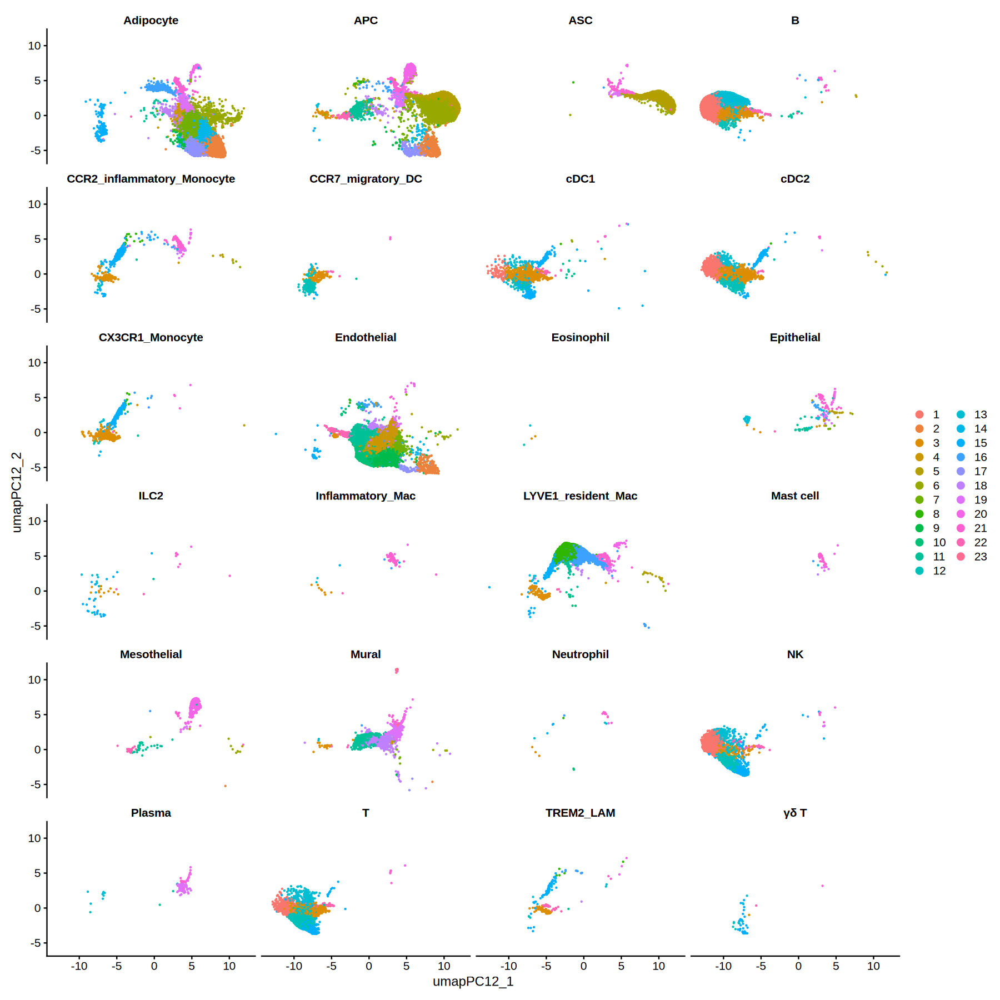

In [66]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  split.by = "Ref2p5_subtype_predicted.id",
  ncol=4
)

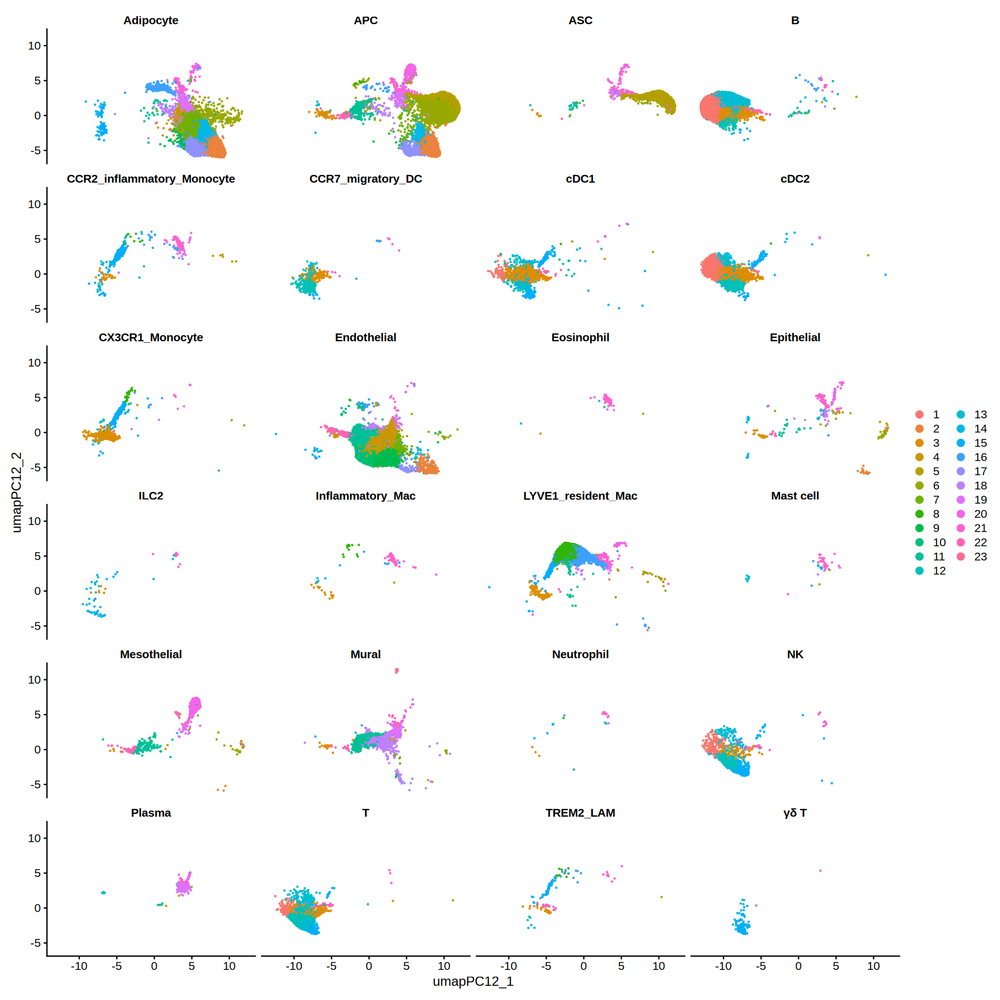

In [67]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  split.by = "RefAll_subtype_predicted.id",
  ncol=4
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


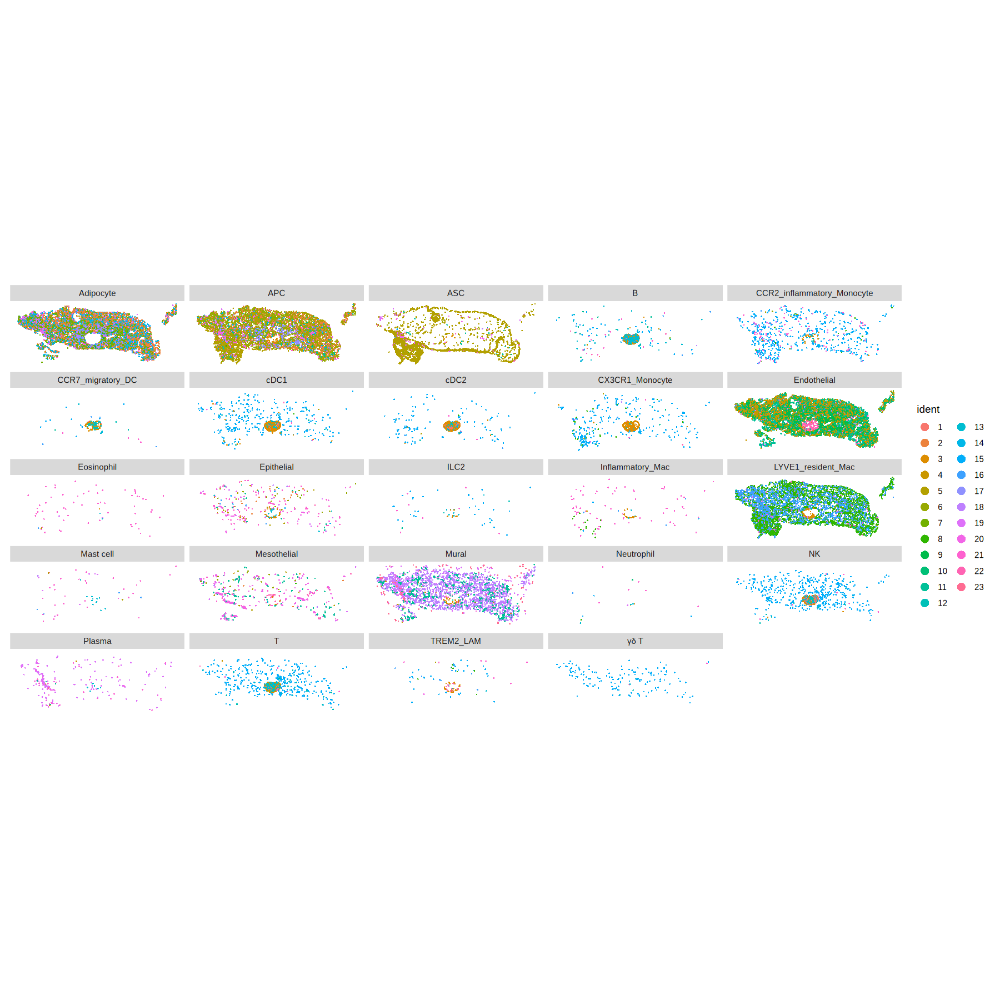

In [68]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "RefAll_subtype_predicted.id",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [69]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [70]:
options(repr.plot.width=15, repr.plot.height=10)

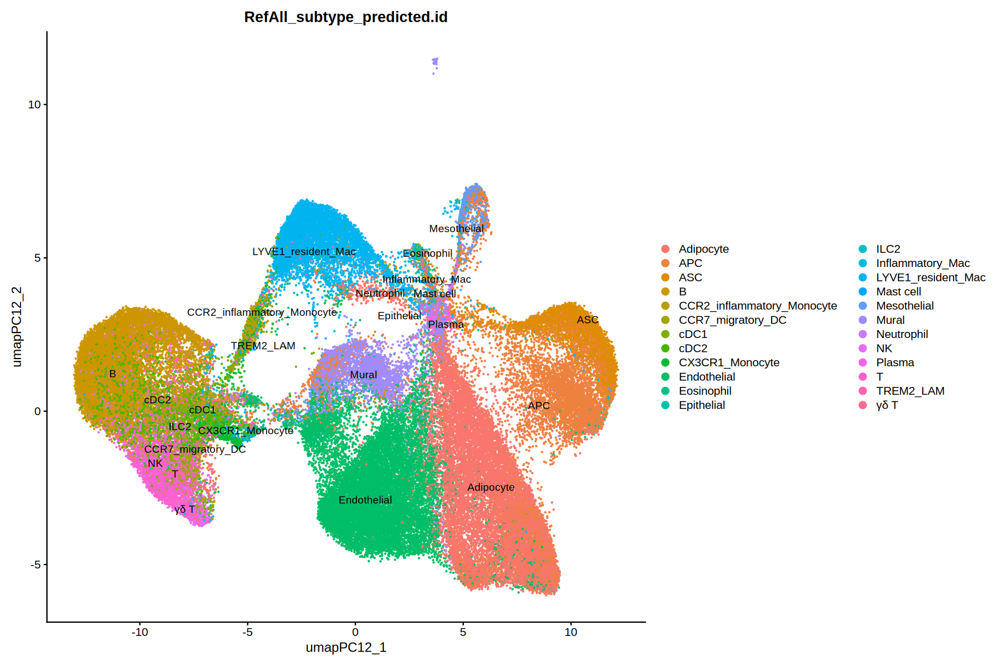

In [71]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("RefAll_subtype_predicted.id"),
  label = TRUE,
  repel = TRUE
)

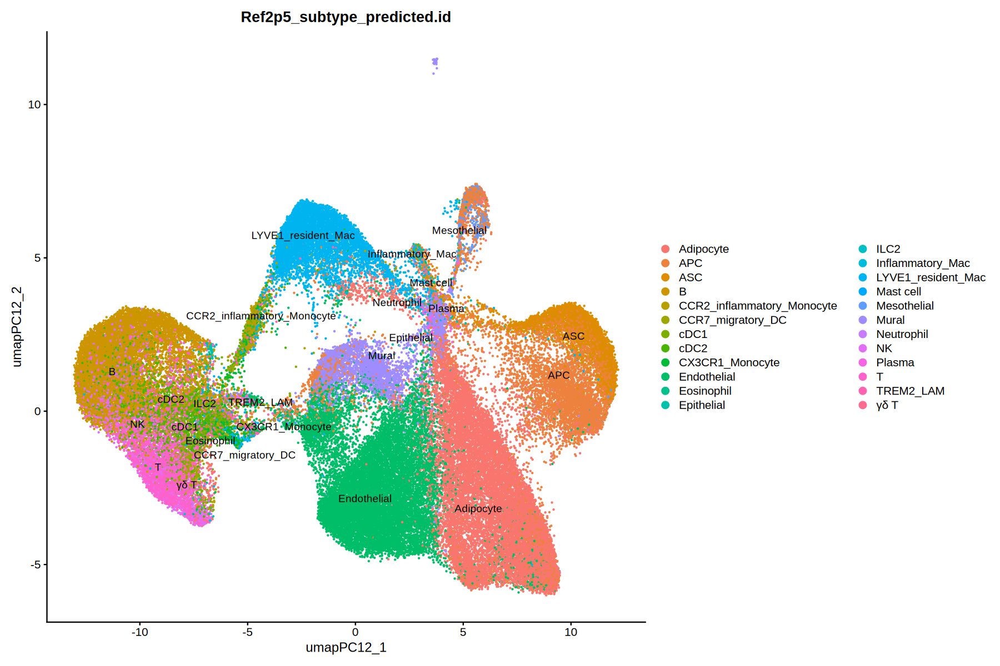

In [72]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("Ref2p5_subtype_predicted.id"),
  label = TRUE,
  repel = TRUE
)

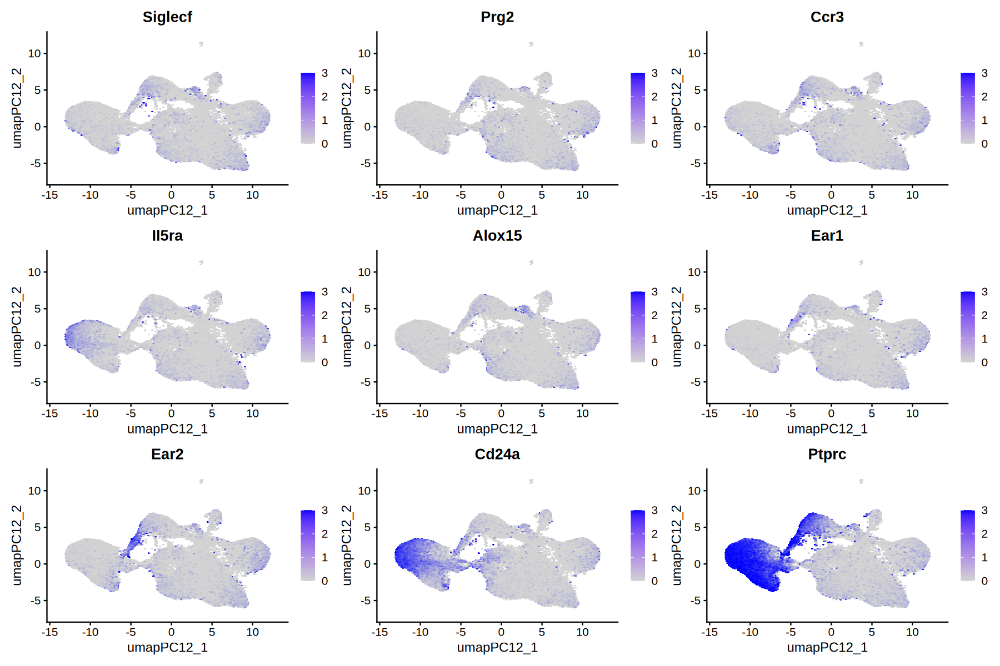

In [73]:
FeaturePlot(
    region_spatial,
    features = c(
        "Siglecf", "Prg2", "Ccr3",
        "Il5ra", "Alox15",
        "Ear1", "Ear2", "Cd24a", "Ptprc"
    ),
    reduction = "umap_PC12",
    raster = TRUE, 
    pt.size = 3, 
    max.cutoff = 3
)

### Refine cell types

In [89]:
annotation_result <- refine_xenium_celltypes(
  object = region_spatial,
  reduction = "pca",
  dims = 1:12,
  k = 15,
  self_weight = 0.70
)

region_spatial <- annotation_result$object

Building transcriptomic kNN: k = 15, reduction = pca, dims = 1:12

Annotation complete.

Review cells: 22167 / 75957 (29.18%)

Schwann ontology-gap rescue: 1091

Lymphatic EC ontology-gap rescue: 0



In [80]:
annotation_result$summary[annotation_result$summary$Final_CellType_subtype=='Eosinophil',]

,Final_CellType_main,Final_CellType_subtype,Final_annotation_source,Final_annotation_confidence,Final_review_flag,n_cells
,<chr>,<chr>,<chr>,<chr>,<lgl>,<int>
19,Eosinophil,Eosinophil,Wang_RefAll_immune,REFERENCE_PRIMARY,FALSE,26
20,Eosinophil,Eosinophil,Wang_RefAll_immune,HIGH_CONCORDANT,FALSE,13
21,Eosinophil,Eosinophil,Wang_RefAll_immune,REVIEW,TRUE,7


In [76]:
annotation_result$summary

Final_CellType_main,Final_CellType_subtype,Final_annotation_source,Final_annotation_confidence,Final_review_flag,n_cells
<chr>,<chr>,<chr>,<chr>,<lgl>,<int>
Adipocyte,Adipocyte,Wang_Xenium_Adipocyte,HIGH_CONCORDANT,FALSE,12601
Adipocyte,Adipocyte,Wang_Xenium_Adipocyte,REVIEW,TRUE,1661
B cell,B,Wang_RefAll_immune,REFERENCE_PRIMARY,FALSE,10558
B cell,B,Wang_RefAll_immune,REVIEW,TRUE,357
DC,cDC2,Wang_RefAll_immune,REFERENCE_PRIMARY,FALSE,1950
DC,cDC1,Wang_RefAll_immune,REFERENCE_PRIMARY,FALSE,685
DC,cDC2,Wang_RefAll_immune,HIGH_CONCORDANT,FALSE,611
DC,cDC1,Wang_RefAll_immune,HIGH_CONCORDANT,FALSE,483
DC,CCR7_migratory_DC,Wang_RefAll_immune,HIGH_CONCORDANT,FALSE,300


In [90]:
table(
  region_spatial$Final_CellType_main[region_spatial$Final_annotation_confidence=="REVIEW"],
  useNA = "ifany"
)

table(
  region_spatial$Final_CellType_subtype[region_spatial$Final_annotation_confidence=="REVIEW"],
  useNA = "ifany"
)

table(
  region_spatial$Final_annotation_confidence
)

table(
  region_spatial$Final_review_flag
)


         Adipocyte             B cell                 DC        Endothelial 
              1661                357                256              11699 
        Eosinophil         Epithelial                ILC         Macrophage 
                 7                199                  3                414 
         Mast cell        Mesothelial           Monocyte              Mural 
                 4                309                155               1025 
            Neural         Neutrophil                 NK             Plasma 
                 9                  1                 25                 13 
Stromal_Fibroblast             T cell 
              5839                191 


                 Adipocyte                        APC 
                      1661                       5588 
                       ASC                          B 
                       251                        357 
              Capillary_EC CCR2_inflammatory_Monocyte 
                     10330                         50 
         CCR7_migratory_DC                       cDC1 
                        26                        110 
                      cDC2            CX3CR1_Monocyte 
                       120                        105 
                Eosinophil                 Epithelial 
                         7                        199 
                      ILC2           Inflammatory_Mac 
                         3                         18 
              Lymphatic_EC         LYVE1_resident_Mac 
                       361                        344 
                 Mast cell                Mesothelial 
                         4                        309 
         


       HIGH_CONCORDANT ONTOLOGY_GAP_SUPPORTED      REFERENCE_PRIMARY 
                 35232                   1082                  17476 
                REVIEW 
                 22167 


FALSE  TRUE 
53790 22167 

In [84]:
region_spatial@meta.data %>%
  dplyr::filter(
    Xenium_cluster_main %in%
      c("Endothelial", "Mural") |
    Final_CellType_main %in%
      c("Endothelial", "Mural")
  ) %>%
  dplyr::count(
    cluster_res_1_2,
    Xenium_cluster_subtype,
    WangKNN_main,
    XeniumKNN_subtype,
    Final_CellType_main,
    Final_CellType_subtype
  ) %>%
  dplyr::group_by(
    cluster_res_1_2
  ) %>%
  dplyr::mutate(
    fraction = n / sum(n)
  ) %>%
  dplyr::ungroup()

cluster_res_1_2,Xenium_cluster_subtype,WangKNN_main,XeniumKNN_subtype,Final_CellType_main,Final_CellType_subtype,n,fraction
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
10,Capillary_EC,Adipocyte,Adipocyte,Adipocyte,Adipocyte,1,0.0002735230
10,Capillary_EC,Adipocyte,Fibroblast,Adipocyte,Adipocyte,1,0.0002735230
10,Capillary_EC,Adipocyte,Lymphatic_EC,Adipocyte,Adipocyte,1,0.0002735230
10,Capillary_EC,Endothelial,ASC,Endothelial,Capillary_EC,1,0.0002735230
10,Capillary_EC,Endothelial,ASC,Endothelial,Venous_EC,1,0.0002735230
10,Capillary_EC,Endothelial,Adipocyte,Endothelial,Capillary_EC,19,0.0051969365
10,Capillary_EC,Endothelial,Adipocyte,Endothelial,Lymphatic_EC,1,0.0002735230
10,Capillary_EC,Endothelial,Capillary_EC,Endothelial,Capillary_EC,3386,0.9261487965
10,Capillary_EC,Endothelial,Eosinophil,Endothelial,Capillary_EC,1,0.0002735230


In [83]:
region_spatial@meta.data %>%
  dplyr::count(
    WangKNN_main,
    XeniumKNN_main,
    Final_CellType_main,
    Final_annotation_confidence
  ) %>%
  dplyr::arrange(
    Final_CellType_main,
    dplyr::desc(n)
  )

WangKNN_main,XeniumKNN_main,Final_CellType_main,Final_annotation_confidence,n
<chr>,<chr>,<chr>,<chr>,<int>
Adipocyte,Adipocyte,Adipocyte,HIGH_CONCORDANT,12601
Adipocyte,Mesothelial,Adipocyte,REVIEW,357
Adipocyte,NK,Adipocyte,REVIEW,332
Adipocyte,Stromal_Fibroblast,Adipocyte,REVIEW,226
Adipocyte,Adipocyte,Adipocyte,REVIEW,153
Adipocyte,Neural,Adipocyte,REVIEW,99
Adipocyte,Monocyte,Adipocyte,REVIEW,91
Adipocyte,Neutrophil,Adipocyte,REVIEW,80
Adipocyte,Macrophage,Adipocyte,REVIEW,76


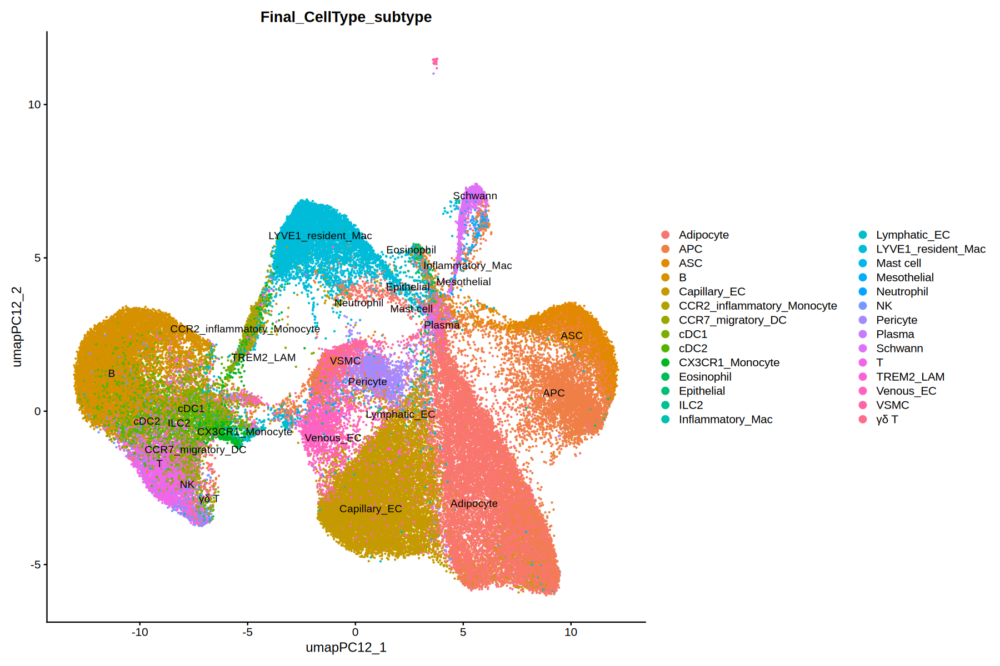

In [91]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("Final_CellType_subtype"),
  label = TRUE,
  repel = TRUE
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


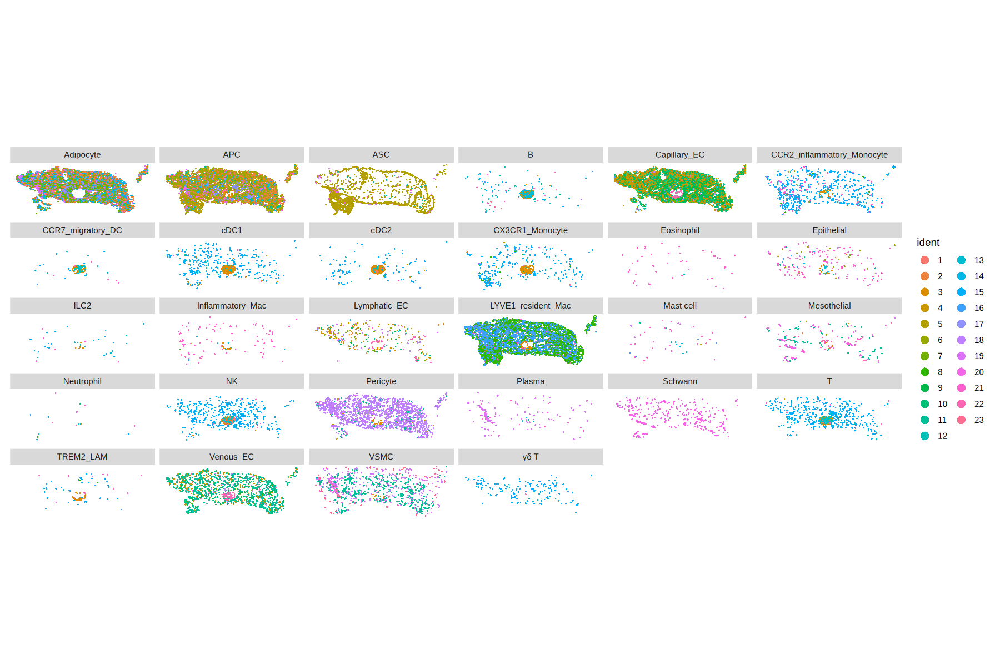

In [92]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "Final_CellType_subtype",
  flip_xy = FALSE,
  dark.background = FALSE
)

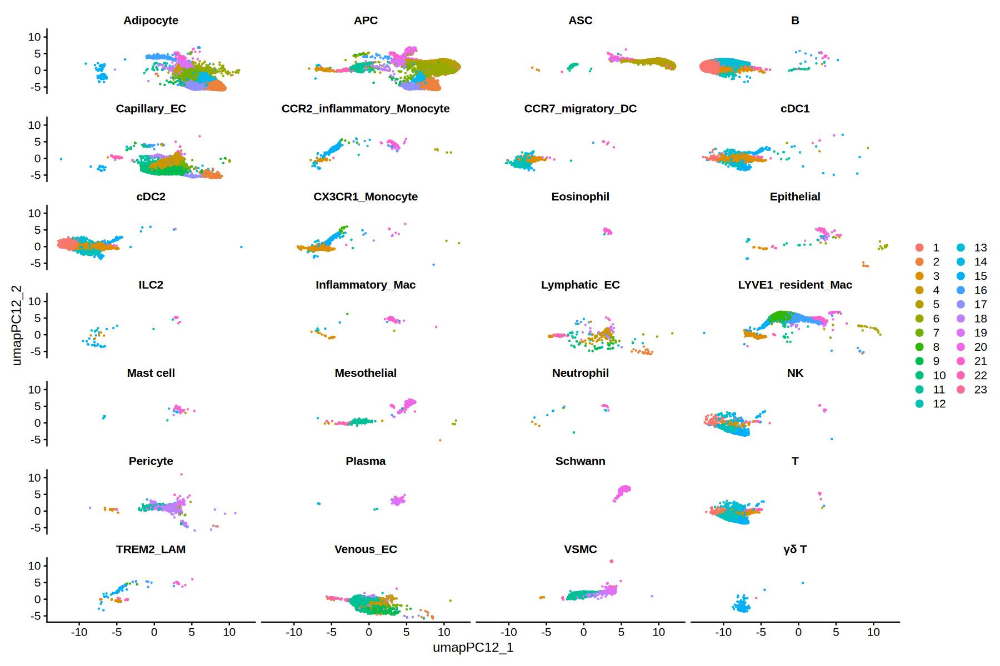

In [93]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  split.by = "Final_CellType_subtype",
  ncol=4
)

In [94]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

## Refine Eos detection

In [34]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [35]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "cell_id"                                                   
  [5] "x_centroid"                                                
  [6] "y_centroid"                                                
  [7] "transcript_counts"                                         
  [8] "control_probe_counts"                                      
  [9] "genomic_control_counts"                                    
 [10] "control_codeword_counts"                                   
 [11] "unassigned_codeword_counts"                                
 [12] "deprecated_codeword_counts"                                
 [13] "total_counts"                                              
 [14] "cell_area"                                                 
 [15] "nucleus_area"                                              
 [16] "nucleus_count"                                             
 [17] "segmentation_method"                                       
 [18] "region_id"                                                 
 [19] "control_fraction_cell"                                     
 [20] "nucleus_missing_flag"                                      
 [21] "multiple_nuclei_flag"                                      
 [22] "cell_area_outlier_flag"                                    
 [23] "high_control_flag"                                         
 [24] "segmentation_multiplet_flag"                               
 [25] "qc_core_pass"                                              
 [26] "qc_review_flag"                                            
 [27] "mouse_id"                                                  
 [28] "section_id"                                                
 [29] "biological_replicate_id"                                   
 [30] "genotype"                                                  
 [31] "treatment"                                                 
 [32] "condition"                                                 
 [33] "age_weeks"                                                 
 [34] "metadata_status"                                           
 [35] "do_not_interpret"                                          
 [36] "grid_x"                                                    
 [37] "grid_y"                                                    
 [38] "grid_id"                                                   
 [39] "edge_proxy"                                                
 [40] "grid_size_um"                                              
 [41] "local_density"                                             
 [42] "dense_aggregate"                                           
 [43] "primary_include"                                           
 [44] "strict_include"                                            
 [45] "hotspot_review_cell"                                       
 [46] "hotspot_sensitivity_include"                               
 [47] "section_status"                                            
 [48] "mask_rule_primary"                                         
 [49] "mask_rule_strict"                                          
 [50] "mask_rule_hotspot_sensitivity"                             
 [51] "provenance"                                                
 [52] "run_label"                                                 
 [53] "execution_mode"                                            
 [54] "generated_utc"                                             
 [55] "source_artifact"                                           
 [56] "section_input_cells"                                       
 [57] "section_primary_include_cells"                             
 [58] "section_strict_include_cells"                              
 [59] "section_hotspot_sensitivity_include_cells"                 
 [60] "qc_threshold_source"                      

In [38]:
sum(region_spatial@meta.data$RefAll_subtype_prediction.score.Eosinophil!=0)

[1] 2951

In [39]:
sum(region_spatial@meta.data$RefAll_subtype_prediction.score.Eosinophil>0.1)

[1] 242

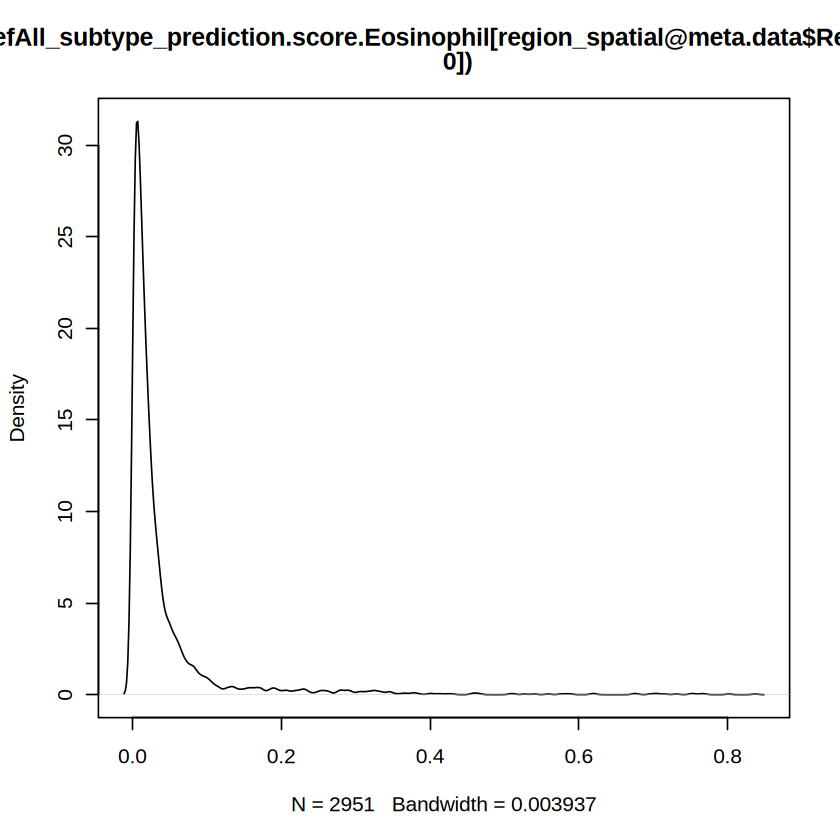

In [37]:
plot(density(region_spatial@meta.data$RefAll_subtype_prediction.score.Eosinophil[region_spatial@meta.data$RefAll_subtype_prediction.score.Eosinophil!=0]))

In [16]:
WANG_REFERENCE_PATH <- file.path(
  "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data",
  "Wang_Science2025_mouse_human",
  "analysis_mouse",
  "Wang_Science2025_cleaned_seurat.rds"
)

In [17]:
scwat_ref <- readRDS(WANG_REFERENCE_PATH)

In [106]:
length(rownames(region_spatial@meta.data)[region_spatial@meta.data$Final_CellType_subtype == "Eosinophil"])

[1] 46

In [105]:
rownames(region_spatial@meta.data)[region_spatial@meta.data$Final_CellType_subtype == "Eosinophil"]

[1] "afaocmpd-1" "aikikpck-1" "akjfbgbc-1" "alalakkb-1" "aofddcoc-1"
 [6] "apmoodab-1" "bagaddml-1" "bdcnfiop-1" "bdepgdhe-1" "bdigaemh-1"
[11] "bdnfgnbm-1" "bemnkopf-1" "bepgigof-1" "bgcejmpc-1" "bgkgdkkk-1"
[16] "bmheoodd-1" "dcdfphha-1" "dgmlmpji-1" "djlkkiin-1" "dkbidcbj-1"
[21] "dkmmonng-1" "dlhdiakk-1" "ebcpngal-1" "ebjiddpo-1" "ebjiklmg-1"
[26] "ejiegfjm-1" "elnkkgfk-1" "gjbnbhfa-1" "hjjbnahf-1" "hofiinfc-1"
[31] "idbdnbld-1" "ijlneiln-1" "jgpclngf-1" "jicgiebf-1" "lllnflhc-1"
[36] "nbkhodgc-1" "nlipnnpn-1" "ogiikefb-1" "ogkeiebh-1" "ogljedob-1"
[41] "ogooikcf-1" "ohfkiogb-1" "ohfogfck-1" "ohgfaila-1" "ohjppail-1"
[46] "ohogiglf-1"

- REF_HIGH_EOS_LIKE = Ccr3+ AND Siglecf+
- REF_PROBABLE_EOS_LIKE = exactly one of Ccr3/Siglecf + at least one reference-validated support pair
- REF_EOS_MARKER_SIGNAL = Ccr3 or Siglecf alone
- REF_LOW_EOS_LIKE = no qualifying core evidence

In [41]:
eos_ref_result <- score_eosinophil_likeness(
  reference = scwat_ref,
  query = region_spatial,
  reference_group_col = "Wang_subtype_harmonized",
  reference_sample_col = NULL,  # replace with actual sample column if available
  reference_assay = "RNA",
  query_assay = "Xenium"
)

region_spatial <- eos_ref_result$object

Core markers: Ccr3, Siglecf

Support markers: Il5ra, Alox15

Context markers: Ear1, Ear2, Itgam

Reference Eosinophils: 180

Reference other immune cells: 15001

Core markers: Ccr3, Siglecf

Core weights: Ccr3=0.614; Siglecf=0.386

Reference-validated support pairs: Ccr3 + Il5ra; Siglecf + Il5ra; Ccr3 + Alox15; Siglecf + Alox15

Reference rule validation: IN_SAMPLE_EXPLORATORY

Eosinophil evidence scoring complete.



In [43]:
eos_ref_result$support_pair_stats %>%
  dplyr::arrange(
    dplyr::desc(eligible_for_probable),
    dplyr::desc(log2_detection_OR_macro)
  )

Core_marker,Support_marker,Pair,n_Eos,Eos_positive,Eos_pct,Other_macro_pct,Max_other_pct,Max_other_celltype,log2_detection_OR_macro,eligible_for_probable
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>
Ccr3,Alox15,Ccr3 + Alox15,180,44,24.444444,0.06210968,0.000000,Mast cell,7.115579,TRUE
Siglecf,Alox15,Siglecf + Alox15,180,14,7.777778,0.06360807,0.000000,Mast cell,5.202433,TRUE
Siglecf,Il5ra,Siglecf + Il5ra,180,4,2.222222,0.00000000,0.000000,Mast cell,3.882979,TRUE
Ccr3,Il5ra,Ccr3 + Il5ra,180,9,5.000000,0.28568619,1.923077,Mast cell,3.598426,TRUE


In [44]:
eos_ref_result$rule_performance

Rule,calibration_method,sensitivity,pooled_false_positive_rate,macro_false_positive_rate,macro_specificity,max_lineage_false_positive_rate,worst_false_positive_lineage
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HIGH_ONLY,IN_SAMPLE_EXPLORATORY,0.1388889,0.0001333244,0.0002200704,0.9997799,0.003521127,TREM2_LAM
HIGH_OR_PROBABLE,IN_SAMPLE_EXPLORATORY,0.3444444,0.0016665556,0.0043341099,0.9956659,0.023255814,Plasma
ANY_CORE_SIGNAL,IN_SAMPLE_EXPLORATORY,0.5500000,0.0220651957,0.0276022093,0.9723978,0.116197183,TREM2_LAM


In [45]:
eos_ref_result$rule_performance

Rule,calibration_method,sensitivity,pooled_false_positive_rate,macro_false_positive_rate,macro_specificity,max_lineage_false_positive_rate,worst_false_positive_lineage
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HIGH_ONLY,IN_SAMPLE_EXPLORATORY,0.1388889,0.0001333244,0.0002200704,0.9997799,0.003521127,TREM2_LAM
HIGH_OR_PROBABLE,IN_SAMPLE_EXPLORATORY,0.3444444,0.0016665556,0.0043341099,0.9956659,0.023255814,Plasma
ANY_CORE_SIGNAL,IN_SAMPLE_EXPLORATORY,0.5500000,0.0220651957,0.0276022093,0.9723978,0.116197183,TREM2_LAM


In [46]:
table(
  region_spatial$Final_CellType_subtype,
  region_spatial$EosRef_call
)

                            
                             OUTSIDE_IMMUNE REF_EOS_MARKER_SIGNAL
  Adipocyte                           14262                     0
  APC                                  8693                     0
  ASC                                  3727                     0
  B                                       0                   428
  Capillary_EC                        12320                     0
  CCR2_inflammatory_Monocyte              0                    97
  CCR7_migratory_DC                       0                    26
  cDC1                                    0                    81
  cDC2                                    0                   118
  CX3CR1_Monocyte                         0                    87
  Eosinophil                              0                    15
  Epithelial                            199                     0
  ILC2                                    0                     7
  Inflammatory_Mac                        0    

In [254]:
options(repr.plot.width=20, repr.plot.height=8)

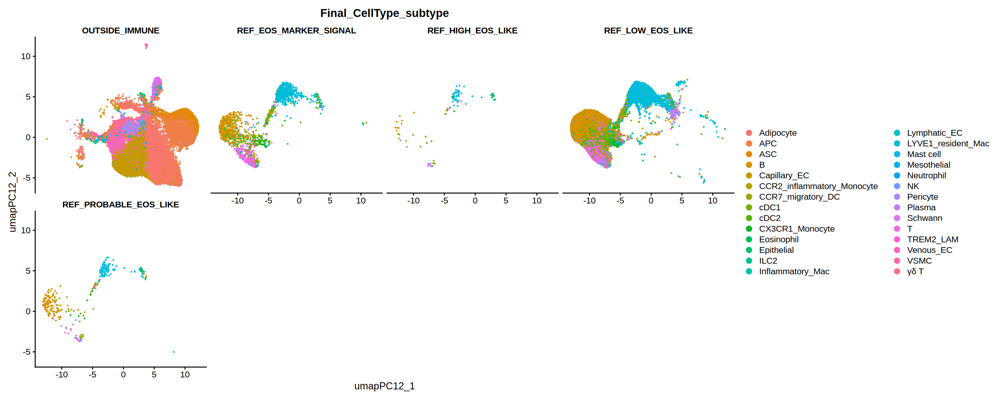

In [255]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = 'Final_CellType_subtype',
  split.by = "EosRef_call",
  ncol=4
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


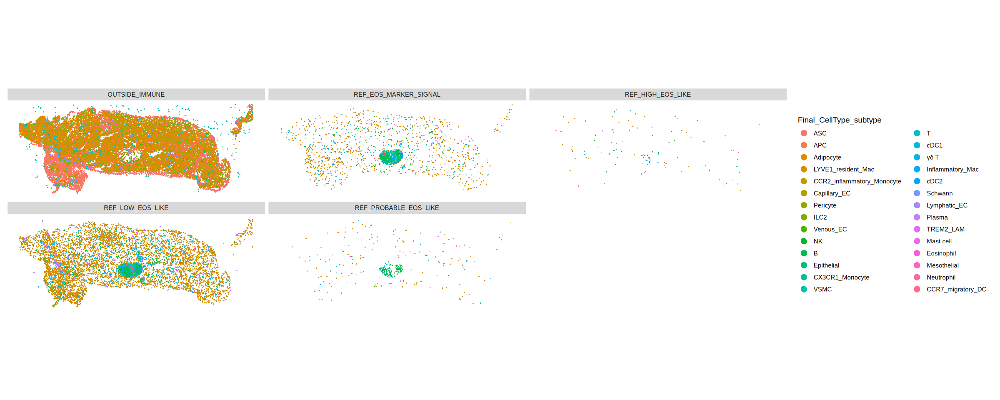

In [256]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
    group.by = 'Final_CellType_subtype',
  split.by = "EosRef_call",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [53]:
library(dplyr)
library(ggplot2)
library(tidyr)

# ============================================================
# 1. Define columns
# ============================================================

call_col  <- "EosRef_call"
score_col <- "RefAll_subtype_prediction.score.Eosinophil"


# Check columns exist
stopifnot(
  call_col %in% colnames(region_spatial@meta.data),
  score_col %in% colnames(region_spatial@meta.data)
)


# ============================================================
# 2. Build plotting dataframe
# ============================================================

eos_wang_df <- region_spatial@meta.data %>%
  tibble::rownames_to_column("cell") %>%
  dplyr::transmute(
    cell = cell,

    EosRef_call =
      as.character(.data[[call_col]]),

    Wang_Eos_score =
      as.numeric(.data[[score_col]]),

    Final_CellType_main =
      as.character(Final_CellType_main),

    Final_CellType_subtype =
      as.character(Final_CellType_subtype)
  ) %>%
  dplyr::filter(
    !is.na(EosRef_call),
    !is.na(Wang_Eos_score)
  )

In [54]:
# ============================================================
# 3. EosRef_call order
#
# First = strongest Eos evidence
# ============================================================

eos_call_order <- c(
  "REF_HIGH_EOS_LIKE",
  "REF_PROBABLE_EOS_LIKE",
  "REF_EOS_MARKER_SIGNAL",
  "REF_LOW_EOS_LIKE",
  "REVIEW_NONIMMUNE_EOS_RESCUE",
  "OUTSIDE_IMMUNE"
)

eos_call_order <- intersect(
  eos_call_order,
  unique(eos_wang_df$EosRef_call)
)

eos_wang_df <- eos_wang_df %>%
  mutate(
    EosRef_call = factor(
      EosRef_call,
      levels = eos_call_order
    )
  )

In [55]:
# ============================================================
# 4. Macaron colors
# ============================================================

eos_macaron_cols <- c(
  "REF_HIGH_EOS_LIKE"            = "#E89A8F",
  "REF_PROBABLE_EOS_LIKE"        = "#F4C6C3",
  "REF_EOS_MARKER_SIGNAL"        = "#F4D6A0",
  "REF_LOW_EOS_LIKE"             = "#BFDCC8",
  "REVIEW_NONIMMUNE_EOS_RESCUE" = "#B9B3D7",
  "OUTSIDE_IMMUNE"               = "#D9D9D9"
)

In [56]:
theme_cell <- function(base_size = 12) {

  theme_classic(base_size = base_size) +

    theme(
      panel.border = element_rect(
        colour = "black",
        fill = NA,
        linewidth = 0.8
      ),

      axis.line = element_line(
        colour = "black",
        linewidth = 0.6
      ),

      axis.text = element_text(
        colour = "black"
      ),

      axis.title = element_text(
        colour = "black"
      ),

      strip.background = element_rect(
        fill = "white",
        colour = "black",
        linewidth = 0.8
      ),

      strip.text = element_text(
        face = "bold"
      ),

      legend.title = element_text(
        face = "bold"
      ),

      plot.title = element_text(
        face = "bold"
      ),

      plot.subtitle = element_text(
        colour = "black"
      )
    )
}

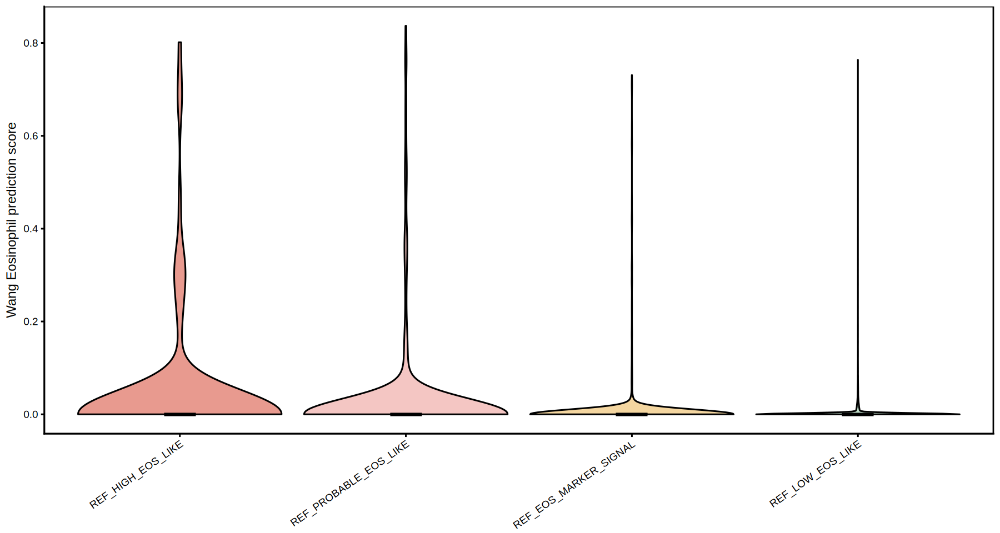

In [59]:
# ============================================================
# 5. MAIN FIGURE
#
# Wang Eosinophil probability by EosRef_call
# ============================================================

plot_df <- eos_wang_df %>%
  filter(
    EosRef_call != "OUTSIDE_IMMUNE"
  )


p_wang_eos_violin <- ggplot(
  plot_df,
  aes(
    x = EosRef_call,
    y = Wang_Eos_score,
    fill = EosRef_call
  )
) +

  geom_violin(
    scale = "width",
    trim = TRUE,
    linewidth = 0.65,
    colour = "black"
  ) +

  geom_boxplot(
    width = 0.14,
    outlier.shape = NA,
    fill = "white",
    colour = "black",
    linewidth = 0.65
  ) +

  scale_fill_manual(
    values = eos_macaron_cols,
    drop = FALSE
  ) +

  labs(
    x = NULL,
    y = "Wang Eosinophil prediction score"
  ) +

  theme_cell(
    base_size = 14
  ) +

  theme(
    legend.position = "none",

    axis.text.x = element_text(
      angle = 35,
      hjust = 1,
      vjust = 1
    )
  )

p_wang_eos_violin

In [69]:
library(dplyr)
library(tidyr)
library(ggplot2)

# ============================================================
# 1. Build summary table
# ============================================================

wang_threshold_summary <- region_spatial@meta.data %>%
  dplyr::filter(
    !is.na(EosRef_call),
    !is.na(RefAll_subtype_prediction.score.Eosinophil)
  ) %>%
  dplyr::group_by(
    EosRef_call
  ) %>%
  dplyr::summarise(
    n_cells = dplyr::n(),

    mean_Wang_Eos_score =
      mean(
        RefAll_subtype_prediction.score.Eosinophil,
        na.rm = TRUE
      ),

    median_Wang_Eos_score =
      median(
        RefAll_subtype_prediction.score.Eosinophil,
        na.rm = TRUE
      ),

    n_score_gt_0 =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0,
        na.rm = TRUE
      ),

    pct_score_gt_0 =
      mean(
        RefAll_subtype_prediction.score.Eosinophil > 0,
        na.rm = TRUE
      ) * 100,

    n_score_gt_0.1 =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0.1,
        na.rm = TRUE
      ),

    pct_score_gt_0.1 =
      mean(
        RefAll_subtype_prediction.score.Eosinophil > 0.1,
        na.rm = TRUE
      ) * 100,

    n_score_gt_0.2 =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0.2,
        na.rm = TRUE
      ),

    pct_score_gt_0.2 =
      mean(
        RefAll_subtype_prediction.score.Eosinophil > 0.2,
        na.rm = TRUE
      ) * 100,

    n_score_gt_0.3 =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0.3,
        na.rm = TRUE
      ),

    pct_score_gt_0.3 =
      mean(
        RefAll_subtype_prediction.score.Eosinophil > 0.3,
        na.rm = TRUE
      ) * 100,

    .groups = "drop"
  )

wang_threshold_summary

EosRef_call,n_cells,mean_Wang_Eos_score,median_Wang_Eos_score,n_score_gt_0,pct_score_gt_0,n_score_gt_0.1,pct_score_gt_0.1,n_score_gt_0.2,pct_score_gt_0.2,n_score_gt_0.3,pct_score_gt_0.3
<chr>,<int>,<dbl>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>
OUTSIDE_IMMUNE,46982,0.000415272,0,474,1.008897,54,0.1149376,27,0.05746882,7,0.01489932
REF_EOS_MARKER_SIGNAL,1977,0.007197749,0,151,7.637835,34,1.7197774,25,1.26454224,17,0.85988872
REF_HIGH_EOS_LIKE,105,0.044975682,0,17,16.190476,11,10.4761905,10,9.52380952,7,6.66666667
REF_LOW_EOS_LIKE,26569,0.002665531,0,2265,8.524973,120,0.4516542,47,0.17689789,21,0.07903948
REF_PROBABLE_EOS_LIKE,324,0.030075266,0,44,13.580247,23,7.0987654,17,5.24691358,15,4.62962963


In [70]:
eos_call_order <- c(
  "REF_HIGH_EOS_LIKE",
  "REF_PROBABLE_EOS_LIKE",
  "REF_EOS_MARKER_SIGNAL",
  "REF_LOW_EOS_LIKE",
  "REVIEW_NONIMMUNE_EOS_RESCUE",
  "OUTSIDE_IMMUNE"
)

wang_threshold_summary <- wang_threshold_summary %>%
  mutate(
    EosRef_call = factor(
      EosRef_call,
      levels = eos_call_order
    )
  ) %>%
  arrange(
    EosRef_call
  )


In [71]:
wang_threshold_summary %>%
  dplyr::select(
    EosRef_call,
    n_cells,
    mean_Wang_Eos_score,
    median_Wang_Eos_score,
    pct_score_gt_0,
    pct_score_gt_0.1,
    pct_score_gt_0.2,
    pct_score_gt_0.3
  )

EosRef_call,n_cells,mean_Wang_Eos_score,median_Wang_Eos_score,pct_score_gt_0,pct_score_gt_0.1,pct_score_gt_0.2,pct_score_gt_0.3
<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
REF_HIGH_EOS_LIKE,105,0.044975682,0,16.190476,10.4761905,9.52380952,6.66666667
REF_PROBABLE_EOS_LIKE,324,0.030075266,0,13.580247,7.0987654,5.24691358,4.62962963
REF_EOS_MARKER_SIGNAL,1977,0.007197749,0,7.637835,1.7197774,1.26454224,0.85988872
REF_LOW_EOS_LIKE,26569,0.002665531,0,8.524973,0.4516542,0.17689789,0.07903948
OUTSIDE_IMMUNE,46982,0.000415272,0,1.008897,0.1149376,0.05746882,0.01489932


In [74]:
wang_threshold_plot_df <- wang_threshold_summary %>%
  dplyr::select(
    EosRef_call,
    pct_score_gt_0,
    pct_score_gt_0.1,
    pct_score_gt_0.2,
    pct_score_gt_0.3
  ) %>%
  tidyr::pivot_longer(
    cols = starts_with("pct_score"),
    names_to = "Threshold",
    values_to = "Percent"
  ) %>%
  mutate(
    Threshold = dplyr::recode(
      Threshold,
      "pct_score_gt_0"   = "> 0",
      "pct_score_gt_0.1" = "> 0.1",
      "pct_score_gt_0.2" = "> 0.2",
      "pct_score_gt_0.3" = "> 0.3"
    ),
    Threshold = factor(
      Threshold,
      levels = c(
        "> 0",
        "> 0.1",
        "> 0.2",
        "> 0.3"
      )
    )
  )

In [72]:
eos_macaron_cols <- c(
  "REF_HIGH_EOS_LIKE"            = "#E89A8F",
  "REF_PROBABLE_EOS_LIKE"        = "#F4C6C3",
  "REF_EOS_MARKER_SIGNAL"        = "#F4D6A0",
  "REF_LOW_EOS_LIKE"             = "#BFDCC8",
  "REVIEW_NONIMMUNE_EOS_RESCUE" = "#B9B3D7",
  "OUTSIDE_IMMUNE"               = "#D9D9D9"
)

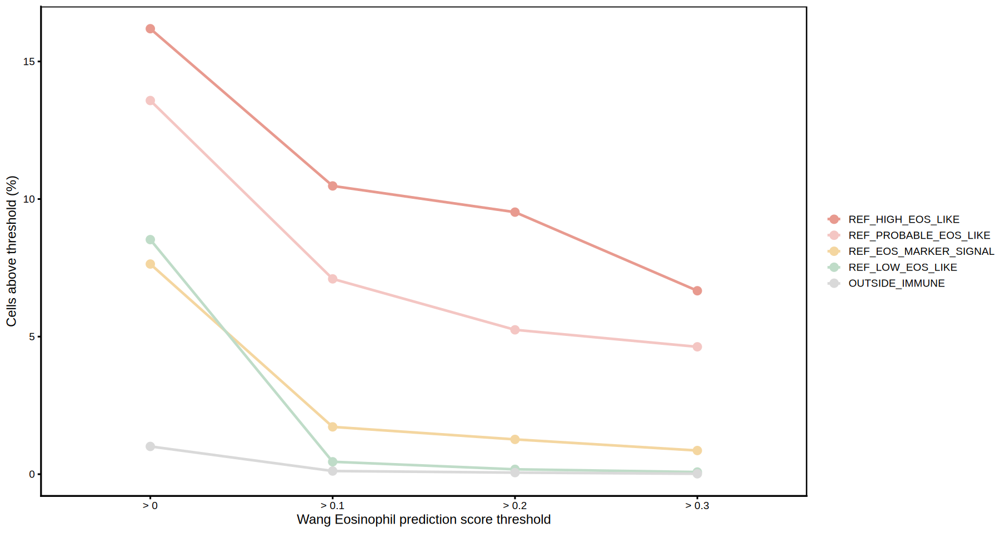

In [75]:
p_wang_threshold <- ggplot(
  wang_threshold_plot_df,
  aes(
    x = Threshold,
    y = Percent,
    group = EosRef_call,
    colour = EosRef_call
  )
) +
  geom_line(
    linewidth = 1
  ) +
  geom_point(
    size = 3.5
  ) +
  scale_colour_manual(
    values = eos_macaron_cols
  ) +
  labs(
    x = "Wang Eosinophil prediction score threshold",
    y = "Cells above threshold (%)",
    colour = NULL
  ) +
  theme_cell(
    base_size = 14
  ) +
  theme(
    legend.position = "right"
  )

p_wang_threshold

In [63]:
wang_agreement_df <- region_spatial@meta.data %>%
  tibble::rownames_to_column("cell") %>%
  transmute(
    cell = cell,

    EosRef_call =
      as.character(EosRef_call),

    Wang_predicted_Eos =
      EosRef_Wang_predicted_Eos
  ) %>%
  filter(
    !is.na(EosRef_call),
    !is.na(Wang_predicted_Eos),
    EosRef_call != "OUTSIDE_IMMUNE"
  ) %>%
  mutate(
    EosRef_call = factor(
      EosRef_call,
      levels = eos_call_order
    )
  )

In [64]:
wang_agreement_summary <- wang_agreement_df %>%
  group_by(
    EosRef_call
  ) %>%
  summarise(
    n = n(),

    n_Wang_Eos =
      sum(
        Wang_predicted_Eos
      ),

    pct_Wang_Eos =
      mean(
        Wang_predicted_Eos
      ) * 100,

    .groups = "drop"
  )

wang_agreement_summary

EosRef_call,n,n_Wang_Eos,pct_Wang_Eos
<fct>,<int>,<int>,<dbl>
REF_HIGH_EOS_LIKE,105,9,8.57142857
REF_PROBABLE_EOS_LIKE,324,11,3.39506173
REF_EOS_MARKER_SIGNAL,1977,18,0.91047041
REF_LOW_EOS_LIKE,26569,24,0.09033084


In [66]:
plot_df_subtype <- eos_wang_df %>%
  filter(
    EosRef_call %in%
      c(
        "REF_HIGH_EOS_LIKE",
        "REF_PROBABLE_EOS_LIKE",
        "REF_EOS_MARKER_SIGNAL"
      )
  ) %>%
  group_by(
    Final_CellType_subtype
  ) %>%
  filter(
    n() >= 5
  ) %>%
  ungroup()

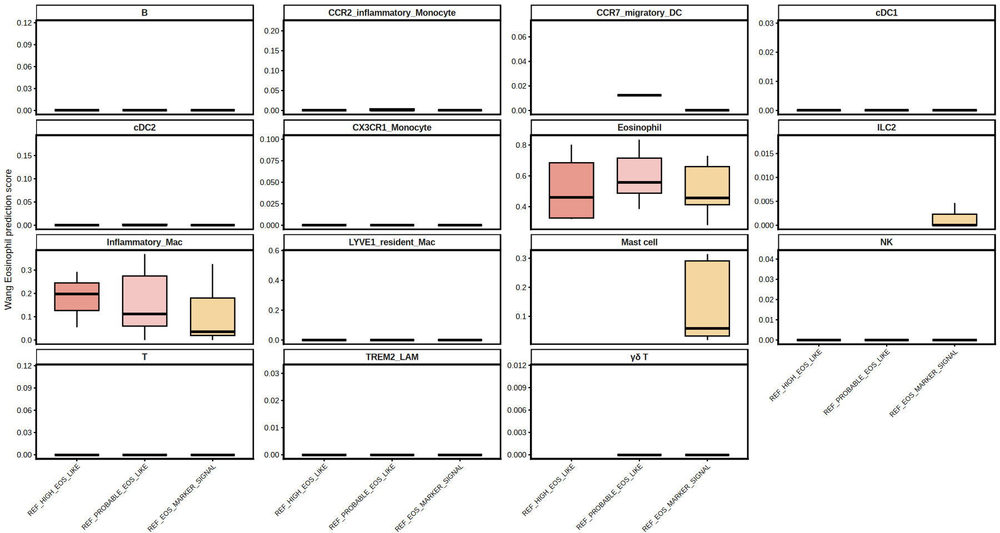

In [67]:
p_wang_by_subtype <- ggplot(
  plot_df_subtype,
  aes(
    x = EosRef_call,
    y = Wang_Eos_score,
    fill = EosRef_call
  )
) +

  geom_boxplot(
    width = 0.65,
    outlier.shape = NA,
    colour = "black",
    linewidth = 0.5
  ) +

  facet_wrap(
    ~ Final_CellType_subtype,
    scales = "free_y"
  ) +

  scale_fill_manual(
    values = eos_macaron_cols
  ) +

  labs(
    x = NULL,
    y = "Wang Eosinophil prediction score"
  ) +

  theme_cell(
    base_size = 10
  ) +

  theme(
    legend.position = "none",

    axis.text.x = element_text(
      angle = 45,
      hjust = 1,
      size = 7
    ),

    strip.text = element_text(
      size = 9,
      face = "bold"
    )
  )

p_wang_by_subtype

In [77]:
# ============================================================
# Add n to EosRef_call labels
# ============================================================

call_n <- wang_threshold_summary %>%
  dplyr::select(
    EosRef_call,
    n_cells
  ) %>%
  dplyr::mutate(
    EosRef_call = as.character(EosRef_call),
    EosRef_call_label = paste0(
      EosRef_call,
      " (n=",
      scales::comma(n_cells),
      ")"
    )
  )

wang_threshold_plot_df <- wang_threshold_plot_df %>%
  dplyr::mutate(
    EosRef_call = as.character(EosRef_call)
  ) %>%
  dplyr::left_join(
    call_n,
    by = "EosRef_call"
  )

In [78]:
call_label_order <- call_n %>%
  dplyr::filter(
    EosRef_call %in% eos_call_order
  ) %>%
  dplyr::arrange(
    match(
      EosRef_call,
      eos_call_order
    )
  ) %>%
  dplyr::pull(
    EosRef_call_label
  )

wang_threshold_plot_df <- wang_threshold_plot_df %>%
  dplyr::mutate(
    EosRef_call_label = factor(
      EosRef_call_label,
      levels = call_label_order
    )
  )

In [81]:
wang_threshold_table <- region_spatial@meta.data %>%
  dplyr::filter(
    !is.na(EosRef_call),
    !is.na(RefAll_subtype_prediction.score.Eosinophil)
  ) %>%
  dplyr::group_by(
    EosRef_call
  ) %>%
  dplyr::summarise(
    n_cells = dplyr::n(),

    gt_0_n =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0
      ),

    gt_0_pct =
      100 * gt_0_n / n_cells,

    gt_0.1_n =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0.1
      ),

    gt_0.1_pct =
      100 * gt_0.1_n / n_cells,

    gt_0.2_n =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0.2
      ),

    gt_0.2_pct =
      100 * gt_0.2_n / n_cells,

    gt_0.3_n =
      sum(
        RefAll_subtype_prediction.score.Eosinophil > 0.3
      ),

    gt_0.3_pct =
      100 * gt_0.3_n / n_cells,

    .groups = "drop"
  ) %>%
  dplyr::mutate(
    `>0` = sprintf(
      "%d / %d (%.1f%%)",
      gt_0_n,
      n_cells,
      gt_0_pct
    ),

    `>0.1` = sprintf(
      "%d / %d (%.1f%%)",
      gt_0.1_n,
      n_cells,
      gt_0.1_pct
    ),

    `>0.2` = sprintf(
      "%d / %d (%.1f%%)",
      gt_0.2_n,
      n_cells,
      gt_0.2_pct
    ),

    `>0.3` = sprintf(
      "%d / %d (%.1f%%)",
      gt_0.3_n,
      n_cells,
      gt_0.3_pct
    )
  ) %>%
  dplyr::select(
    EosRef_call,
    n_cells,
    `>0`,
    `>0.1`,
    `>0.2`,
    `>0.3`
  )

In [87]:
wang_threshold_table = wang_threshold_table[match(
    c("REF_HIGH_EOS_LIKE", "REF_PROBABLE_EOS_LIKE", "REF_EOS_MARKER_SIGNAL", "REF_LOW_EOS_LIKE", "OUTSIDE_IMMUNE"),
    wang_threshold_table$EosRef_call
),]

In [88]:
wang_threshold_table

EosRef_call,n_cells,>0,>0.1,>0.2,>0.3
<fct>,<int>,<chr>,<chr>,<chr>,<chr>
REF_HIGH_EOS_LIKE,105,17 / 105 (16.2%),11 / 105 (10.5%),10 / 105 (9.5%),7 / 105 (6.7%)
REF_PROBABLE_EOS_LIKE,324,44 / 324 (13.6%),23 / 324 (7.1%),17 / 324 (5.2%),15 / 324 (4.6%)
REF_EOS_MARKER_SIGNAL,1977,151 / 1977 (7.6%),34 / 1977 (1.7%),25 / 1977 (1.3%),17 / 1977 (0.9%)
REF_LOW_EOS_LIKE,26569,2265 / 26569 (8.5%),120 / 26569 (0.5%),47 / 26569 (0.2%),21 / 26569 (0.1%)
OUTSIDE_IMMUNE,46982,474 / 46982 (1.0%),54 / 46982 (0.1%),27 / 46982 (0.1%),7 / 46982 (0.0%)


In [100]:
library(dplyr)
library(tidyr)
library(ggplot2)
library(scales)

wang_score_col <- "RefAll_subtype_prediction.score.Eosinophil"

# ============================================================
# 1. HIGH / PROBABLE cells only
# ============================================================

eos_subtype_df <- region_spatial@meta.data %>%
  tibble::rownames_to_column("cell") %>%
  dplyr::transmute(
    cell = cell,

    EosRef_call =
      as.character(EosRef_call),

    Final_CellType_main =
      as.character(Final_CellType_main),

    Final_CellType_subtype =
      as.character(Final_CellType_subtype),

    Wang_Eos_score =
      as.numeric(.data[[wang_score_col]]),

    Wang_predicted_Eos =
      as.logical(EosRef_Wang_predicted_Eos),

    Ccr3 =
      as.logical(EosRef_detect_Ccr3),

    Siglecf =
      as.logical(EosRef_detect_Siglecf),

    Il5ra =
      as.logical(EosRef_detect_Il5ra),

    Alox15 =
      as.logical(EosRef_detect_Alox15)
  ) %>%
  dplyr::filter(
    EosRef_call %in% c(
      "REF_HIGH_EOS_LIKE",
      "REF_PROBABLE_EOS_LIKE"
    )
  )

In [101]:
# ============================================================
# 2. Summary by EosRef_call × current subtype
# ============================================================

eos_subtype_wang_summary <- eos_subtype_df %>%
  dplyr::group_by(
    EosRef_call,
    Final_CellType_subtype
  ) %>%
  dplyr::summarise(

    n_cells = dplyr::n(),

    mean_Wang_Eos_score =
      mean(
        Wang_Eos_score,
        na.rm = TRUE
      ),

    median_Wang_Eos_score =
      median(
        Wang_Eos_score,
        na.rm = TRUE
      ),

    n_Wang_gt_0.1 =
      sum(
        Wang_Eos_score > 0.1,
        na.rm = TRUE
      ),

    pct_Wang_gt_0.1 =
      mean(
        Wang_Eos_score > 0.1,
        na.rm = TRUE
      ) * 100,

    n_Wang_gt_0.2 =
      sum(
        Wang_Eos_score > 0.2,
        na.rm = TRUE
      ),

    pct_Wang_gt_0.2 =
      mean(
        Wang_Eos_score > 0.2,
        na.rm = TRUE
      ) * 100,

    n_Wang_gt_0.3 =
      sum(
        Wang_Eos_score > 0.3,
        na.rm = TRUE
      ),

    pct_Wang_gt_0.3 =
      mean(
        Wang_Eos_score > 0.3,
        na.rm = TRUE
      ) * 100,

    n_Wang_predicted_Eos =
      sum(
        Wang_predicted_Eos %in% TRUE,
        na.rm = TRUE
      ),

    pct_Wang_predicted_Eos =
      mean(
        Wang_predicted_Eos %in% TRUE,
        na.rm = TRUE
      ) * 100,

    .groups = "drop"
  ) %>%
  dplyr::arrange(
    factor(
      EosRef_call,
      levels = c(
        "REF_HIGH_EOS_LIKE",
        "REF_PROBABLE_EOS_LIKE"
      )
    ),
    dplyr::desc(pct_Wang_gt_0.2),
    dplyr::desc(n_cells)
  )

eos_subtype_wang_summary

EosRef_call,Final_CellType_subtype,n_cells,mean_Wang_Eos_score,median_Wang_Eos_score,n_Wang_gt_0.1,pct_Wang_gt_0.1,n_Wang_gt_0.2,pct_Wang_gt_0.2,n_Wang_gt_0.3,pct_Wang_gt_0.3,n_Wang_predicted_Eos,pct_Wang_predicted_Eos
<chr>,<chr>,<int>,<dbl>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>
REF_HIGH_EOS_LIKE,Eosinophil,7,0.5145271888,0.458939999,7,100.000000,7,100.000000,7,100,7,100.000000
REF_HIGH_EOS_LIKE,Inflammatory_Mac,3,0.1815862968,0.198321965,2,66.666667,1,33.333333,0,0,0,0.000000
REF_HIGH_EOS_LIKE,LYVE1_resident_Mac,46,0.0113440211,0.000000000,2,4.347826,2,4.347826,0,0,2,4.347826
REF_HIGH_EOS_LIKE,B,14,0.0021284241,0.000000000,0,0.000000,0,0.000000,0,0,0,0.000000
REF_HIGH_EOS_LIKE,NK,9,0.0022224051,0.000000000,0,0.000000,0,0.000000,0,0,0,0.000000
REF_HIGH_EOS_LIKE,cDC1,6,0.0000000000,0.000000000,0,0.000000,0,0.000000,0,0,0,0.000000
REF_HIGH_EOS_LIKE,cDC2,5,0.0000000000,0.000000000,0,0.000000,0,0.000000,0,0,0,0.000000
REF_HIGH_EOS_LIKE,CCR2_inflammatory_Monocyte,4,0.0000000000,0.000000000,0,0.000000,0,0.000000,0,0,0,0.000000
REF_HIGH_EOS_LIKE,CX3CR1_Monocyte,4,0.0000000000,0.000000000,0,0.000000,0,0.000000,0,0,0,0.000000


In [102]:
# ============================================================
# 3. Publication/report-friendly table
# ============================================================

eos_subtype_wang_table <- eos_subtype_wang_summary %>%
  dplyr::mutate(

    `Wang >0.1` = sprintf(
      "%d / %d (%.1f%%)",
      n_Wang_gt_0.1,
      n_cells,
      pct_Wang_gt_0.1
    ),

    `Wang >0.2` = sprintf(
      "%d / %d (%.1f%%)",
      n_Wang_gt_0.2,
      n_cells,
      pct_Wang_gt_0.2
    ),

    `Wang >0.3` = sprintf(
      "%d / %d (%.1f%%)",
      n_Wang_gt_0.3,
      n_cells,
      pct_Wang_gt_0.3
    ),

    `Wang predicted Eos` = sprintf(
      "%d / %d (%.1f%%)",
      n_Wang_predicted_Eos,
      n_cells,
      pct_Wang_predicted_Eos
    )
  ) %>%
  dplyr::select(
    EosRef_call,
    Final_CellType_subtype,
    n_cells,
    mean_Wang_Eos_score,
    median_Wang_Eos_score,
    `Wang >0.1`,
    `Wang >0.2`,
    `Wang >0.3`,
    `Wang predicted Eos`
  )

eos_subtype_wang_table

EosRef_call,Final_CellType_subtype,n_cells,mean_Wang_Eos_score,median_Wang_Eos_score,Wang >0.1,Wang >0.2,Wang >0.3,Wang predicted Eos
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
REF_HIGH_EOS_LIKE,Eosinophil,7,0.5145271888,0.458939999,7 / 7 (100.0%),7 / 7 (100.0%),7 / 7 (100.0%),7 / 7 (100.0%)
REF_HIGH_EOS_LIKE,Inflammatory_Mac,3,0.1815862968,0.198321965,2 / 3 (66.7%),1 / 3 (33.3%),0 / 3 (0.0%),0 / 3 (0.0%)
REF_HIGH_EOS_LIKE,LYVE1_resident_Mac,46,0.0113440211,0.000000000,2 / 46 (4.3%),2 / 46 (4.3%),0 / 46 (0.0%),2 / 46 (4.3%)
REF_HIGH_EOS_LIKE,B,14,0.0021284241,0.000000000,0 / 14 (0.0%),0 / 14 (0.0%),0 / 14 (0.0%),0 / 14 (0.0%)
REF_HIGH_EOS_LIKE,NK,9,0.0022224051,0.000000000,0 / 9 (0.0%),0 / 9 (0.0%),0 / 9 (0.0%),0 / 9 (0.0%)
REF_HIGH_EOS_LIKE,cDC1,6,0.0000000000,0.000000000,0 / 6 (0.0%),0 / 6 (0.0%),0 / 6 (0.0%),0 / 6 (0.0%)
REF_HIGH_EOS_LIKE,cDC2,5,0.0000000000,0.000000000,0 / 5 (0.0%),0 / 5 (0.0%),0 / 5 (0.0%),0 / 5 (0.0%)
REF_HIGH_EOS_LIKE,CCR2_inflammatory_Monocyte,4,0.0000000000,0.000000000,0 / 4 (0.0%),0 / 4 (0.0%),0 / 4 (0.0%),0 / 4 (0.0%)
REF_HIGH_EOS_LIKE,CX3CR1_Monocyte,4,0.0000000000,0.000000000,0 / 4 (0.0%),0 / 4 (0.0%),0 / 4 (0.0%),0 / 4 (0.0%)


In [109]:
eos_subtype_wang_summary <- eos_subtype_df %>%
  dplyr::group_by(
    EosRef_call,
    Final_CellType_subtype
  ) %>%
  dplyr::summarise(

    # all cells in this EosRef_call × subtype group
    n_cells_total = dplyr::n(),

    # cells for which a Wang Eos score is actually available
    n_Wang_available =
      sum(!is.na(Wang_Eos_score)),

    mean_Wang_Eos_score =
      mean(
        Wang_Eos_score,
        na.rm = TRUE
      ),

    median_Wang_Eos_score =
      median(
        Wang_Eos_score,
        na.rm = TRUE
      ),

    n_Wang_gt_0.1 =
      sum(
        Wang_Eos_score > 0.1,
        na.rm = TRUE
      ),

    pct_Wang_gt_0.1 =
      100 *
      n_Wang_gt_0.1 /
      n_Wang_available,

    n_Wang_gt_0.2 =
      sum(
        Wang_Eos_score > 0.2,
        na.rm = TRUE
      ),

    pct_Wang_gt_0.2 =
      100 *
      n_Wang_gt_0.2 /
      n_Wang_available,

    n_Wang_gt_0.3 =
      sum(
        Wang_Eos_score > 0.3,
        na.rm = TRUE
      ),

    pct_Wang_gt_0.3 =
      100 *
      n_Wang_gt_0.3 /
      n_Wang_available,

    .groups = "drop"
  ) %>%
  dplyr::mutate(
    dplyr::across(
      starts_with("pct_"),
      ~ ifelse(
        n_Wang_available > 0,
        .x,
        NA_real_
      )
    )
  )

In [111]:
heatmap_df <- dplyr::bind_rows(

  eos_subtype_wang_summary %>%
    dplyr::transmute(
      EosRef_call,
      Final_CellType_subtype,
      n_cells_total,
      n_Wang_available,
      Threshold = "> 0.1",
      Percent = pct_Wang_gt_0.1,
      Count = n_Wang_gt_0.1
    ),

  eos_subtype_wang_summary %>%
    dplyr::transmute(
      EosRef_call,
      Final_CellType_subtype,
      n_cells_total,
      n_Wang_available,
      Threshold = "> 0.2",
      Percent = pct_Wang_gt_0.2,
      Count = n_Wang_gt_0.2
    ),

  eos_subtype_wang_summary %>%
    dplyr::transmute(
      EosRef_call,
      Final_CellType_subtype,
      n_cells_total,
      n_Wang_available,
      Threshold = "> 0.3",
      Percent = pct_Wang_gt_0.3,
      Count = n_Wang_gt_0.3
    )
) %>%

  dplyr::mutate(

    Threshold = factor(
      Threshold,
      levels = c(
        "> 0.1",
        "> 0.2",
        "> 0.3"
      )
    ),

    Tile_label = ifelse(
      n_Wang_available > 0,
      paste0(
        Count,
        "/",
        n_Wang_available
      ),
      "NA"
    )
  )

In [113]:
# ============================================================
# 5. Order subtypes
# ============================================================

subtype_order <- eos_subtype_wang_summary %>%
  dplyr::group_by(
    Final_CellType_subtype
  ) %>%
  dplyr::summarise(
    max_pct_gt_0.2 =
      max(
        pct_Wang_gt_0.2,
        na.rm = TRUE
      ),
    .groups = "drop"
  ) %>%
  dplyr::arrange(
    max_pct_gt_0.2
  ) %>%
  dplyr::pull(
    Final_CellType_subtype
  )

heatmap_df <- heatmap_df %>%
  dplyr::mutate(
    Final_CellType_subtype = factor(
      Final_CellType_subtype,
      levels = subtype_order
    )
  )

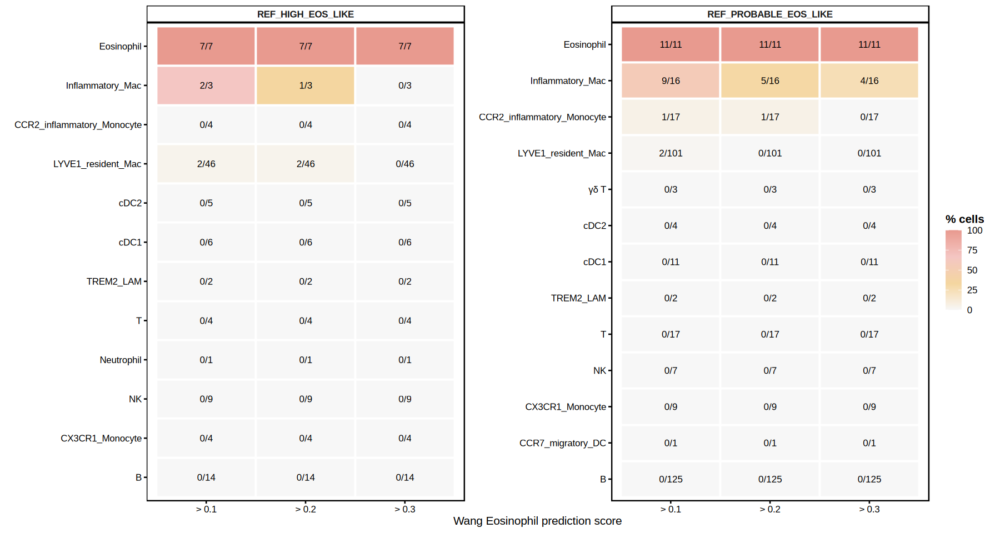

In [114]:
p_eos_subtype_wang_heatmap <- ggplot(
  heatmap_df,
  aes(
    x = Threshold,
    y = Final_CellType_subtype,
    fill = Percent
  )
) +

  geom_tile(
    colour = "white",
    linewidth = 0.8
  ) +

  geom_text(
    aes(
      label = Tile_label
    ),
    size = 3.5,
    colour = "black"
  ) +

  facet_wrap(
    ~ EosRef_call,
    scales = "free_y",
    nrow = 1
  ) +

  scale_fill_gradientn(
    colours = c(
      "#F7F7F7",
      "#F4D6A0",
      "#F4C6C3",
      "#E89A8F"
    ),
    limits = c(0, 100),
    na.value = "white"
  ) +

  labs(
    x = "Wang Eosinophil prediction score",
    y = NULL,
    fill = "% cells"
  ) +

  theme_classic(
    base_size = 12
  ) +

  theme(
    panel.border = element_rect(
      colour = "black",
      fill = NA,
      linewidth = 0.8
    ),

    axis.line = element_blank(),

    axis.text = element_text(
      colour = "black"
    ),

    strip.background = element_rect(
      fill = "white",
      colour = "black",
      linewidth = 0.8
    ),

    strip.text = element_text(
      face = "bold"
    ),

    legend.title = element_text(
      face = "bold"
    )
  )

p_eos_subtype_wang_heatmap

In [115]:
wang_col <- "RefAll_subtype_prediction.score.Eosinophil"

md <- region_spatial@meta.data

morph_review_cells <- rownames(md)[
  md$EosRef_call == "REF_HIGH_EOS_LIKE" &
    !is.na(md[[wang_col]]) &
    md[[wang_col]] == 0
]

length(morph_review_cells)

[1] 88

In [116]:
md[
  morph_review_cells,
  c(
    "Final_CellType_main",
    "Final_CellType_subtype",
    "EosRef_call",
    "EosRef_core_pattern",
    wang_col
  ),
  drop = FALSE
] %>%
  dplyr::count(
    Final_CellType_main,
    Final_CellType_subtype,
    sort = TRUE
  )

Final_CellType_main,Final_CellType_subtype,n
<chr>,<chr>,<int>
Macrophage,LYVE1_resident_Mac,43
B cell,B,13
NK,NK,7
DC,cDC1,6
DC,cDC2,5
Monocyte,CCR2_inflammatory_Monocyte,4
Monocyte,CX3CR1_Monocyte,4
T cell,T,4
Macrophage,TREM2_LAM,2


In [117]:
region_spatial$Eos_morphology_review <- "Other"

region_spatial$Eos_morphology_review[
  colnames(region_spatial) %in%
    morph_review_cells
] <- "HIGH_marker_Wang0"

table(region_spatial$Eos_morphology_review)


HIGH_marker_Wang0             Other 
               88             75869 

In [129]:
region_spatial[["fov"]]

Spatial coordinates for 75957 cells
Default segmentation boundary: centroids 
 2 other segmentation boundaries present: segmentation, nucleus_segmentation 
Associated assay: Xenium 
Key: fov_ 

In [130]:
Boundaries(region_spatial[["fov"]])

[1] "centroids"            "segmentation"         "nucleus_segmentation"

In [131]:
Molecules(region_spatial[["fov"]])

NULL

In [133]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(tibble)

fov_obj <- region_spatial[["fov"]]

centroids <- GetTissueCoordinates(
  fov_obj,
  which = "centroids"
) %>%
  as.data.frame()

cell_seg <- GetTissueCoordinates(
  fov_obj,
  which = "segmentation"
) %>%
  as.data.frame()

nucleus_seg <- GetTissueCoordinates(
  fov_obj,
  which = "nucleus_segmentation"
) %>%
  as.data.frame()

head(centroids)
head(cell_seg)
head(nucleus_seg)

colnames(centroids)
colnames(cell_seg)
colnames(nucleus_seg)

,x,y,cell
,<dbl>,<dbl>,<chr>
1,1207.875,2257.219,aaaacgbo-1
2,1188.792,2288.468,aaacfimf-1
3,1205.326,2278.074,aaadebej-1
4,1221.673,2247.593,aaadjbdg-1
5,1219.466,2275.023,aaaeajgo-1
6,1219.588,2268.615,aaaedgkj-1


,x,y,cell
,<dbl>,<dbl>,<chr>
1,1208.275,2253.350,aaaacgbo-1
2,1208.062,2253.562,aaaacgbo-1
3,1207.425,2253.775,aaaacgbo-1
4,1205.938,2254.200,aaaacgbo-1
5,1203.812,2256.325,aaaacgbo-1
6,1203.600,2256.750,aaaacgbo-1


,x,y,cell
,<dbl>,<dbl>,<chr>
1,1208.912,2253.775,aaaacgbo-1
2,1208.275,2253.988,aaaacgbo-1
3,1207.425,2254.625,aaaacgbo-1
4,1206.363,2255.050,aaaacgbo-1
5,1204.875,2256.325,aaaacgbo-1
6,1204.450,2257.175,aaaacgbo-1


[1] "x"    "y"    "cell"

[1] "x"    "y"    "cell"

[1] "x"    "y"    "cell"

In [134]:
standardize_spatial_coords <- function(df) {

  df <- as.data.frame(df)

  # cell ID
  if (!"cell" %in% colnames(df)) {

    if ("cell_id" %in% colnames(df)) {
      df$cell <- as.character(df$cell_id)

    } else {
      df$cell <- rownames(df)
    }
  }

  # x coordinate
  x_col <- intersect(
    c("x", "x_centroid"),
    colnames(df)
  )[1]

  # y coordinate
  y_col <- intersect(
    c("y", "y_centroid"),
    colnames(df)
  )[1]

  if (
    is.na(x_col) ||
    is.na(y_col)
  ) {
    stop(
      "Could not identify x/y columns. Columns are: ",
      paste(colnames(df), collapse = ", ")
    )
  }

  df$x_plot <- df[[x_col]]
  df$y_plot <- df[[y_col]]

  df
}

In [135]:
centroids <- standardize_spatial_coords(
  centroids
)

cell_seg <- standardize_spatial_coords(
  cell_seg
)

nucleus_seg <- standardize_spatial_coords(
  nucleus_seg
)

In [136]:
wang_col <- "RefAll_subtype_prediction.score.Eosinophil"

md <- region_spatial@meta.data

morph_review_cells <- rownames(md)[
  md$EosRef_call == "REF_HIGH_EOS_LIKE" &
    !is.na(md[[wang_col]]) &
    md[[wang_col]] == 0
]

length(morph_review_cells)

table(
  md[
    morph_review_cells,
    "Final_CellType_subtype"
  ],
  useNA = "ifany"
)

[1] 88


                         B CCR2_inflammatory_Monocyte 
                        13                          4 
                      cDC1                       cDC2 
                         6                          5 
           CX3CR1_Monocyte         LYVE1_resident_Mac 
                         4                         43 
                        NK                          T 
                         7                          4 
                 TREM2_LAM 
                         2 

In [ ]:
plot_eos_morphology_review <- function(
  object,
  cell,
  centroids,
  cell_seg,
  nucleus_seg,
  radius = 40,
  subtype_col = "Final_CellType_subtype",
  eos_label = "Eosinophil"
) {

  md <- object@meta.data

  if (!cell %in% centroids$cell) {
    stop("Cell not found in centroid coordinates: ", cell)
  }

  if (!cell %in% rownames(md)) {
    stop("Cell not found in Seurat metadata: ", cell)
  }

  # ----------------------------------------------------------
  # Candidate center
  # ----------------------------------------------------------

  xy <- centroids %>%
    dplyr::filter(
      cell == !!cell
    ) %>%
    dplyr::slice(1)

  x0 <- xy$x_plot
  y0 <- xy$y_plot


  # ----------------------------------------------------------
  # Nearby cells within radius
  # ----------------------------------------------------------

  nearby <- centroids %>%
    dplyr::mutate(
      distance = sqrt(
        (x_plot - x0)^2 +
        (y_plot - y0)^2
      )
    ) %>%
    dplyr::filter(
      distance <= radius
    )

  nearby_cells <- nearby$cell


  # ----------------------------------------------------------
  # Metadata for local cells
  # ----------------------------------------------------------

  local_md <- md[
    intersect(
      nearby_cells,
      rownames(md)
    ),
    ,
    drop = FALSE
  ] %>%
    tibble::rownames_to_column("cell") %>%
    dplyr::mutate(

      Review_group = dplyr::case_when(

        cell == !!cell ~
          "HIGH marker / Wang=0",

        as.character(.data[[subtype_col]]) ==
          eos_label ~
          "Annotated Eosinophil",

        TRUE ~
          "Other"
      )
    )


  # ----------------------------------------------------------
  # Local cell segmentation
  # ----------------------------------------------------------

  seg_local <- cell_seg %>%
    dplyr::filter(
      cell %in% nearby_cells
    ) %>%
    dplyr::left_join(
      local_md %>%
        dplyr::select(
          cell,
          Review_group
        ),
      by = "cell"
    )


  # ----------------------------------------------------------
  # Local nuclei
  # ----------------------------------------------------------

  nuc_local <- nucleus_seg %>%
    dplyr::filter(
      cell %in% nearby_cells
    )


  # ----------------------------------------------------------
  # Candidate polygons
  # ----------------------------------------------------------

  candidate_seg <- seg_local %>%
    dplyr::filter(
      cell == !!cell
    )

  candidate_nuc <- nuc_local %>%
    dplyr::filter(
      cell == !!cell
    )


  # ----------------------------------------------------------
  # Candidate annotation
  # ----------------------------------------------------------

  candidate_subtype <- as.character(
    md[cell, subtype_col]
  )

  candidate_wang <- md[
    cell,
    wang_col
  ]

  title_text <- paste0(
    cell,
    "\n",
    candidate_subtype,
    " | Ccr3+ Siglecf+ | Wang Eos=",
    signif(candidate_wang, 3)
  )


  # ----------------------------------------------------------
  # Plot
  # ----------------------------------------------------------

  ggplot() +

    # Cells
    geom_polygon(
      data = seg_local,
      aes(
        x = x_plot,
        y = y_plot,
        group = cell,
        fill = Review_group
      ),
      colour = "grey70",
      linewidth = 0.20,
      alpha = 0.65
    ) +

    # Nuclei
    geom_polygon(
      data = nuc_local,
      aes(
        x = x_plot,
        y = y_plot,
        group = cell
      ),
      fill = "white",
      colour = "black",
      linewidth = 0.30
    ) +

    # Candidate cell outline
    geom_polygon(
      data = candidate_seg,
      aes(
        x = x_plot,
        y = y_plot,
        group = cell
      ),
      fill = NA,
      colour = "#C94845",
      linewidth = 1.2
    ) +

    # Candidate nucleus outline
    geom_polygon(
      data = candidate_nuc,
      aes(
        x = x_plot,
        y = y_plot,
        group = cell
      ),
      fill = NA,
      colour = "#C94845",
      linewidth = 0.8
    ) +

    scale_fill_manual(
      values = c(
        "HIGH marker / Wang=0" = "#E89A8F",
        "Annotated Eosinophil" = "#B7C3E0",
        "Other" = "#E8E8E8"
      )
    ) +

    coord_fixed(
      xlim = c(
        x0 - radius,
        x0 + radius
      ),
      ylim = c(
        y0 - radius,
        y0 + radius
      ),
      expand = FALSE
    ) +

    labs(
      title = title_text,
      x = NULL,
      y = NULL,
      fill = NULL
    ) +

    theme_classic(
      base_size = 12
    ) +

    theme(
      axis.text = element_blank(),
      axis.ticks = element_blank(),

      panel.border = element_rect(
        colour = "black",
        fill = NA,
        linewidth = 0.8
      ),

      plot.title = element_text(
        face = "bold",
        size = 11
      ),

      legend.position = "bottom"
    )
}

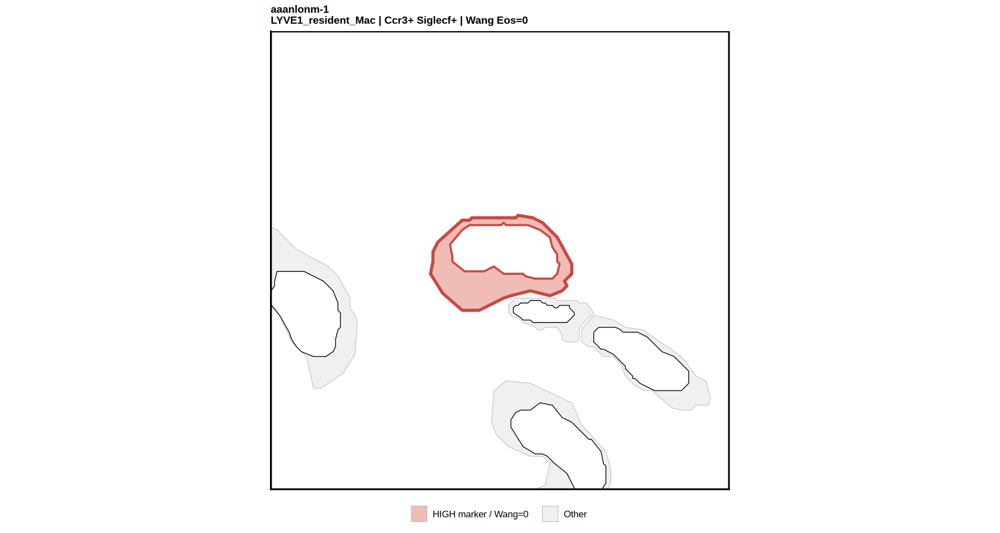

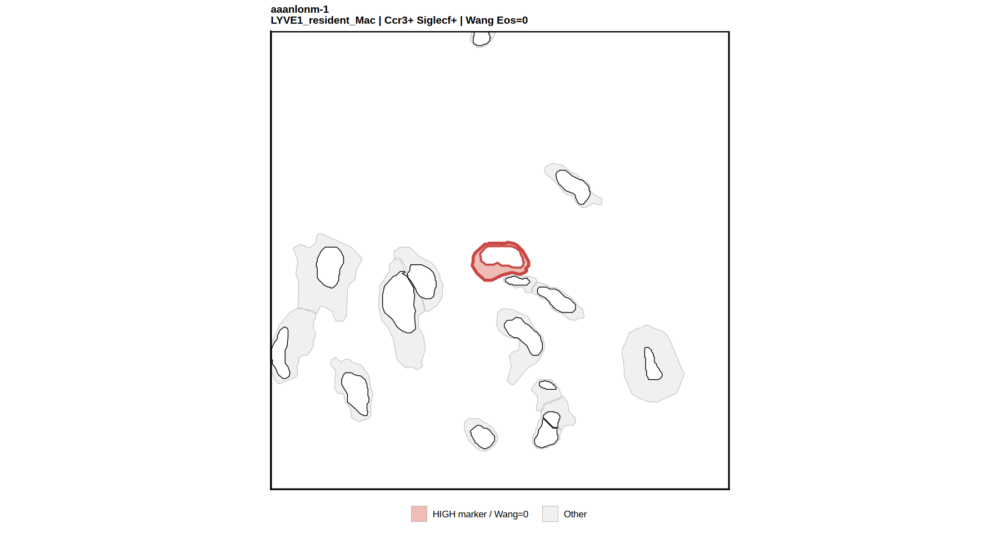

In [139]:
plot_eos_morphology_review(
  region_spatial,
  morph_review_cells[1],
  centroids,
  cell_seg,
  nucleus_seg,
  radius = 20
)

plot_eos_morphology_review(
  region_spatial,
  morph_review_cells[1],
  centroids,
  cell_seg,
  nucleus_seg,
  radius = 50
)

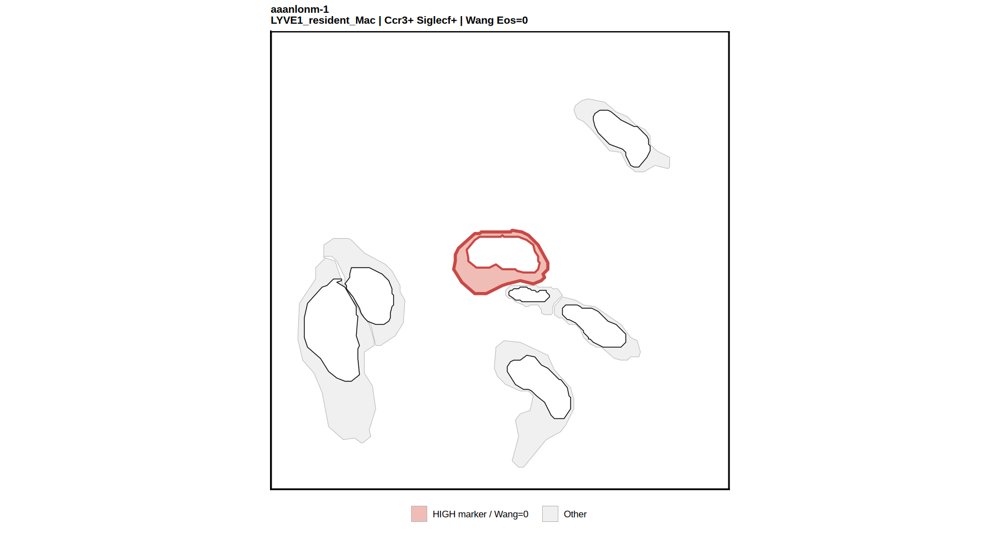

In [138]:
plot_eos_morphology_review(
  object = region_spatial,
  cell = morph_review_cells[1],
  centroids = centroids,
  cell_seg = cell_seg,
  nucleus_seg = nucleus_seg,
  radius = 30
)

In [189]:
DefaultBoundary(region_spatial[["fov"]]) <- "centroids"

DefaultBoundary(region_spatial[["fov"]])
# [1] "centroids"

Boundaries(region_spatial[["fov"]])
# centroids, segmentation, nucleus_segmentation

[1] "centroids"

[1] "centroids"            "segmentation"         "nucleus_segmentation"

In [212]:
cropped.coords <- Crop(region_spatial[["fov"]], x = c(1200, 1900), y = c(3750, 4050), coords = "plot")

Overlaying compact Segmentation objects is currently not supported.

Overlaying compact Segmentation objects is currently not supported.



In [213]:
zoom_cells <- Cells(
  cropped.coords[["centroids"]]
)

length(zoom_cells)

[1] 365

In [214]:
cell_coords <- SeuratObject::GetTissueCoordinates(
  region_spatial[["fov"]][["segmentation"]],
  full = TRUE
)

head(cell_coords)

,x,y,cell
,<dbl>,<dbl>,<chr>
1,1208.275,2253.350,aaaacgbo-1
2,1208.062,2253.562,aaaacgbo-1
3,1207.425,2253.775,aaaacgbo-1
4,1205.938,2254.200,aaaacgbo-1
5,1203.812,2256.325,aaaacgbo-1
6,1203.600,2256.750,aaaacgbo-1


In [215]:
cell_coords_zoom <- cell_coords[
  cell_coords$cell %in% zoom_cells,
  c("x", "y", "cell"),
  drop = FALSE
]

cat(
  "Cells:", length(unique(cell_coords_zoom$cell)), "\n",
  "Vertices:", nrow(cell_coords_zoom), "\n"
)

Cells: 365 
 Vertices: 9105 


In [216]:
zoom_seg <- SeuratObject::CreateSegmentation(
  coords = cell_coords_zoom,
  compact = FALSE
)

In [217]:
cropped.coords[["segmentation"]] <- zoom_seg

Boundaries(cropped.coords)

[1] "centroids"    "segmentation"

In [218]:
nucleus_coords <- SeuratObject::GetTissueCoordinates(
  region_spatial[["fov"]][["nucleus_segmentation"]],
  full = TRUE
)

nucleus_coords_zoom <- nucleus_coords[
  nucleus_coords$cell %in% zoom_cells,
  c("x", "y", "cell"),
  drop = FALSE
]

zoom_nucleus <- SeuratObject::CreateSegmentation(
  coords = nucleus_coords_zoom,
  compact = FALSE
)

cropped.coords[["nucleus_segmentation"]] <- zoom_nucleus

In [219]:
DefaultBoundary(cropped.coords) <- "segmentation"

In [220]:
region_spatial[["zoom"]] <- cropped.coords

Warning message:
“Key ‘fov_’ taken, using ‘zoom_’ instead”


In [221]:
region_spatial[["zoom"]]

Boundaries(region_spatial[["zoom"]])
DefaultBoundary(region_spatial[["zoom"]])

Spatial coordinates for 365 cells and 477 molecules
 First 10 molecules: 0610005C13Rik, 1110017D15Rik, 2610528A11Rik, 5330417C22Rik, 6330403K07Rik, A330076H08Rik
Default segmentation boundary: segmentation 
 2 other segmentation boundaries present: centroids, nucleus_segmentation 
Associated assay: Xenium 
Key: zoom_ 

[1] "segmentation"         "centroids"            "nucleus_segmentation"

[1] "segmentation"

In [ ]:
Final_CellType_subtype

In [ ]:
EosRef_call

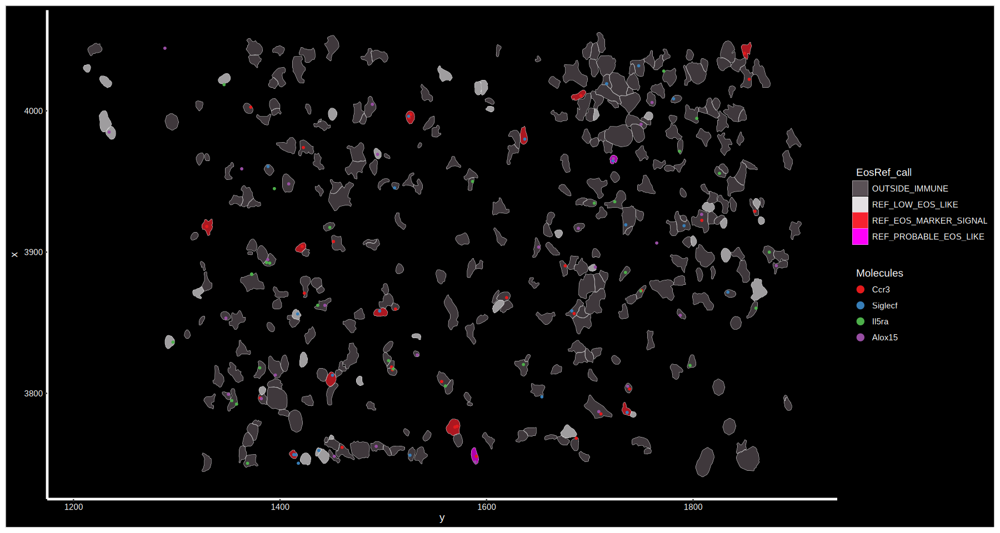

In [247]:
ImageDimPlot(region_spatial, fov = "zoom", axes = TRUE, border.color = "white", border.size = 0.1, cols = "polychrome",
    coord.fixed = FALSE, group.by = "EosRef_call",
  molecules = c(
    "Ccr3",
    "Siglecf",
    "Il5ra",
    "Alox15"
  ), nmols = 10000,alpha = 0.7,mols.size = 0.5)

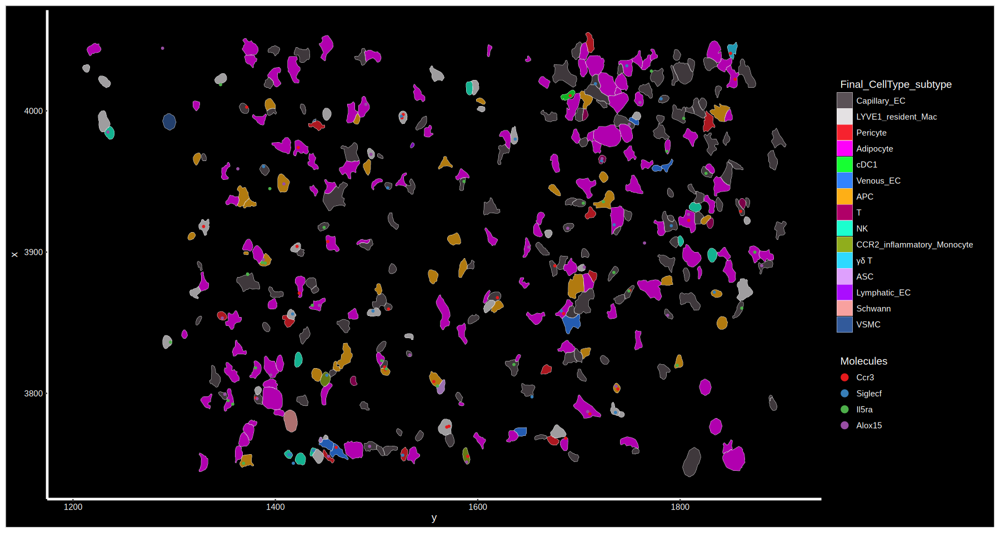

In [245]:
ImageDimPlot(region_spatial, fov = "zoom", axes = TRUE, border.color = "white", border.size = 0.1, cols = "polychrome",
    coord.fixed = FALSE, group.by = "Final_CellType_subtype",
  molecules = c(
    "Ccr3",
    "Siglecf",
    "Il5ra",
    "Alox15"
  ), nmols = 10000,alpha = 0.7,mols.size = 0.5)

In [242]:
plot_eos_cell <- function(
  object,
  cell,
  radius = 75,
  fov = "fov",
  group.by = "EosRef_call",
  molecules = c(
    "Ccr3",
    "Siglecf",
    "Il5ra",
    "Alox15"
  )
) {

  ## ------------------------------
  ## centroid
  ## ------------------------------

  cent <- SeuratObject::GetTissueCoordinates(
    object[[fov]][["centroids"]]
  )

  if (!cell %in% cent$cell) {
    stop("Cell not found: ", cell)
  }

  cx <- cent[cent$cell %in% cell, "x"]
  cy <- cent[cent$cell %in% cell, "y"]

  ## ------------------------------
  ## crop
  ## ------------------------------

  SeuratObject::DefaultBoundary(
    object[[fov]]
  ) <- "centroids"

  zoom <- Crop(
    object[[fov]],
    x = c(cx - radius, cx + radius),
    y = c(cy - radius, cy + radius),
    coords = "plot"
  )

  zoom_cells <- Cells(
    zoom[["centroids"]]
  )

  ## ------------------------------
  ## reconstruct cell segmentation
  ## ------------------------------

  seg <- SeuratObject::GetTissueCoordinates(
    object[[fov]][["segmentation"]],
    full = TRUE
  )

  seg <- seg[
    seg$cell %in% zoom_cells,
    c("x", "y", "cell"),
    drop = FALSE
  ]

  zoom[["segmentation"]] <-
    SeuratObject::CreateSegmentation(
      coords = seg,
      compact = FALSE
    )

  SeuratObject::DefaultBoundary(zoom) <-
    "segmentation"

  ## ------------------------------
  ## temporary FOV
  ## ------------------------------

  object[["eos_review"]] <- zoom

  ## ------------------------------
  ## plot
  ## ------------------------------

  ImageDimPlot(
    object,
    fov = "eos_review",
    group.by = group.by,
    molecules = molecules,
    nmols = 10000,
    cols = "polychrome",
    border.color = "white",
    border.size = 0.2,
    axes = TRUE,
    coord.fixed = TRUE,
    flip_xy = FALSE,
    dark.background = FALSE
  ) 
}

Overlaying compact Segmentation objects is currently not supported.

Overlaying compact Segmentation objects is currently not supported.

Warning message:
“Key ‘fov_’ taken, using ‘eosreview_’ instead”
Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


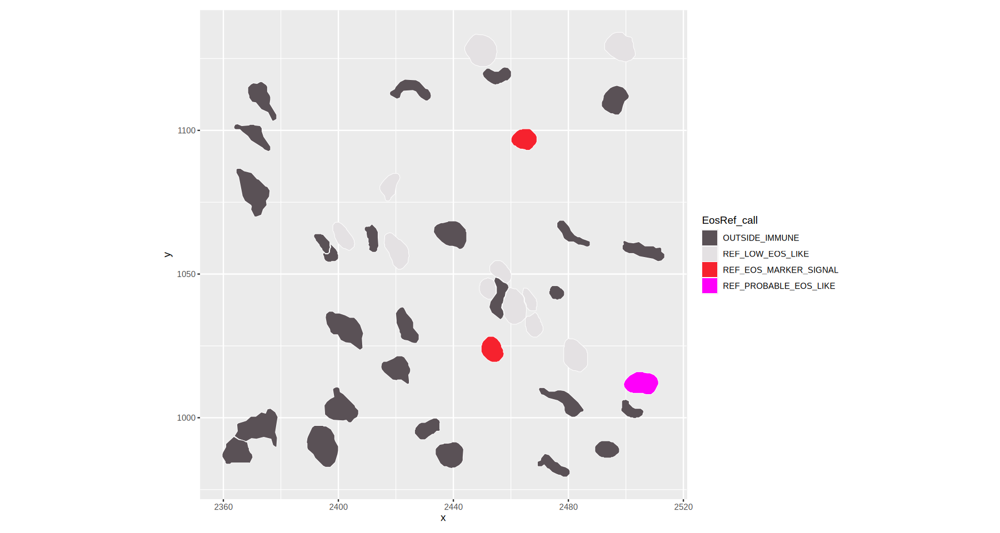

In [243]:
plot_eos_cell(region_spatial, cell=eos_high_cells[1])

In [225]:
table(region_spatial$EosRef_call)


       OUTSIDE_IMMUNE REF_EOS_MARKER_SIGNAL     REF_HIGH_EOS_LIKE 
                46982                  1977                   105 
     REF_LOW_EOS_LIKE REF_PROBABLE_EOS_LIKE 
                26569                   324 

In [226]:
eos_high_cells <- colnames(region_spatial)[
  region_spatial$EosRef_call == "REF_HIGH_EOS_LIKE"
]

length(eos_high_cells)

[1] 105

In [229]:
cell_use

[1] "aaanlonm-1"

In [230]:
head(cent)

,x,y,cell
,<dbl>,<dbl>,<chr>
1,1207.875,2257.219,aaaacgbo-1
2,1188.792,2288.468,aaacfimf-1
3,1205.326,2278.074,aaadebej-1
4,1221.673,2247.593,aaadjbdg-1
5,1219.466,2275.023,aaaeajgo-1
6,1219.588,2268.615,aaaedgkj-1


In [231]:
cell_use <- eos_high_cells[1]

cent <- SeuratObject::GetTissueCoordinates(
  region_spatial[["fov"]][["centroids"]]
)

cx <- cent[cent$cell %in% cell_use, "x"]
cy <- cent[cent$cell %in% cell_use, "y"]

cx
cy

[1] 1054.961

[1] 2437.707

In [232]:
SeuratObject::DefaultBoundary(
  region_spatial[["fov"]]
) <- "centroids"

zoom_fov <- Crop(
  region_spatial[["fov"]],
  x = c(cx - 75, cx + 75),
  y = c(cy - 75, cy + 75),
  coords = "plot"
)

Overlaying compact Segmentation objects is currently not supported.

Overlaying compact Segmentation objects is currently not supported.



In [233]:
zoom_cells <- Cells(
  zoom_fov[["centroids"]]
)

seg_coords <- SeuratObject::GetTissueCoordinates(
  region_spatial[["fov"]][["segmentation"]],
  full = TRUE
)

seg_zoom <- seg_coords[
  seg_coords$cell %in% zoom_cells,
  c("x", "y", "cell"),
  drop = FALSE
]

zoom_fov[["segmentation"]] <-
  SeuratObject::CreateSegmentation(
    coords = seg_zoom,
    compact = FALSE
  )

SeuratObject::DefaultBoundary(
  zoom_fov
) <- "segmentation"

region_spatial[["eos_zoom"]] <- zoom_fov

Warning message:
“Key ‘fov_’ taken, using ‘eoszoom_’ instead”


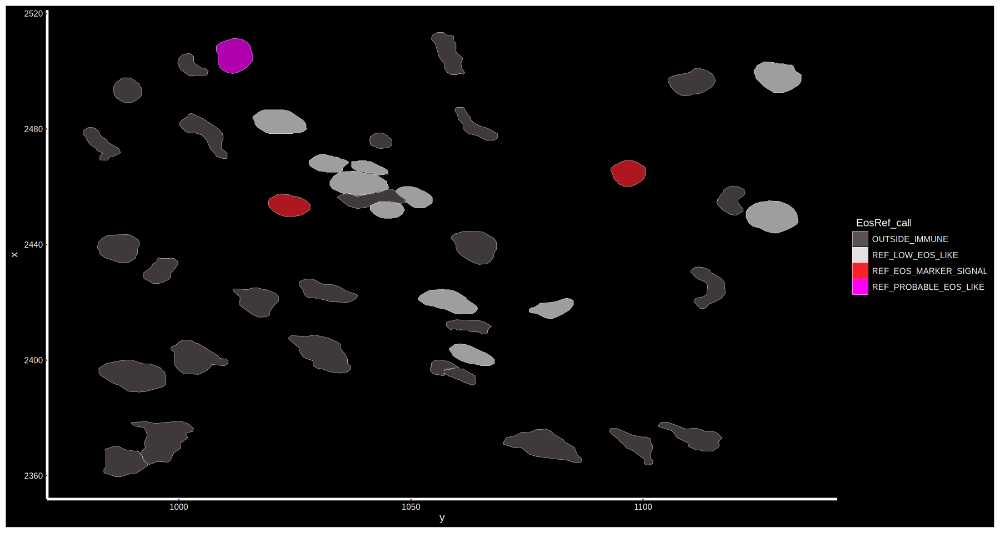

In [244]:
ImageDimPlot(region_spatial, fov = "eos_zoom", axes = TRUE, border.color = "white", border.size = 0.1, cols = "polychrome",
    coord.fixed = FALSE, group.by = "EosRef_call",
  molecules = c(
    "Ccr3",
    "Siglecf",
    "Il5ra",
    "Alox15"
  ), nmols = 10000,alpha = 0.7,mols.size = 3)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


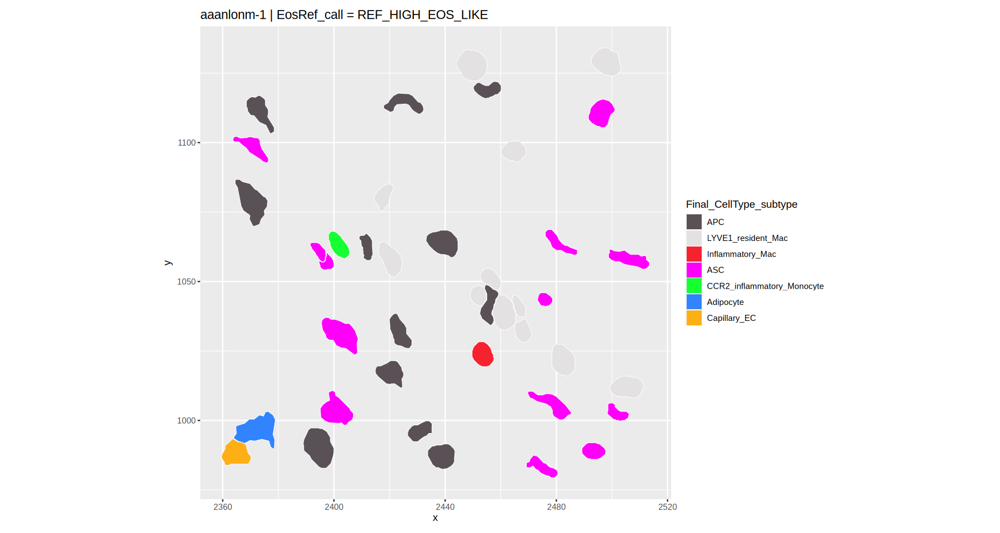

In [234]:
ImageDimPlot(
  region_spatial,
  fov = "eos_zoom",
  group.by = "Final_CellType_subtype",
  molecules = c(
    "Ccr3",
    "Siglecf",
    "Il5ra",
    "Alox15"
  ),
  nmols = 10000,
  cols = "polychrome",
  border.color = "white",
  border.size = 0.2,
  axes = TRUE,
  coord.fixed = TRUE,
  flip_xy = FALSE,
  dark.background = FALSE
) +
  ggplot2::ggtitle(
    paste0(
      cell_use,
      " | EosRef_call = ",
      region_spatial$EosRef_call[
        match(cell_use, colnames(region_spatial))
      ]
    )
  )

In [121]:
coords <- GetTissueCoordinates(
  region_spatial[["fov"]]
)

head(coords)
colnames(coords)

,x,y,cell
,<dbl>,<dbl>,<chr>
1,1207.875,2257.219,aaaacgbo-1
2,1188.792,2288.468,aaacfimf-1
3,1205.326,2278.074,aaadebej-1
4,1221.673,2247.593,aaadjbdg-1
5,1219.466,2275.023,aaaeajgo-1
6,1219.588,2268.615,aaaedgkj-1


[1] "x"    "y"    "cell"

In [122]:
candidate_coords <- coords %>%
  dplyr::filter(
    cell %in% morph_review_cells
  )

candidate_coords

x,y,cell
<dbl>,<dbl>,<chr>
1054.9614,2437.7070,aaanlonm-1
1120.9357,3782.4055,aafbabhb-1
981.1486,3057.2759,aandnkao-1
1339.1105,3516.9329,acdahdll-1
1656.8661,3689.1162,acigaapi-1
2141.4150,2099.1226,adhcdnea-1
2334.4202,1734.9293,admcncla-1
2174.0732,3574.9116,aedfjmog-1
1695.6548,1744.1049,agldbmjd-1


In [123]:
candidate_review <- candidate_coords %>%
  dplyr::left_join(
    md %>%
      tibble::rownames_to_column("cell"),
    by = "cell"
  ) %>%
  dplyr::select(
    cell,
    dplyr::everything()
  )

candidate_review

cell,x,y,orig.ident,nCount_Xenium,nFeature_Xenium,cell_id,x_centroid,y_centroid,transcript_counts,⋯,EosRef_marker_combination,EosRef_Wang_predicted_Eos,EosRef_Wang_Eos_score,EosRef_detect_Ccr3,EosRef_detect_Siglecf,EosRef_detect_Il5ra,EosRef_detect_Alox15,EosRef_detect_Ear1,EosRef_detect_Ear2,EosRef_detect_Itgam
<chr>,<dbl>,<dbl>,<fct>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<int>,⋯,<chr>,<lgl>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
aaanlonm-1,1054.9614,2437.7070,Region_3,466,122,aaanlonm-1,1054.9614,2437.7070,466,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE
aafbabhb-1,1120.9357,3782.4055,Region_3,375,111,aafbabhb-1,1120.9357,3782.4055,375,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE
aandnkao-1,981.1486,3057.2759,Region_3,130,70,aandnkao-1,981.1486,3057.2759,130,⋯,Ccr3 + Siglecf,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE
acdahdll-1,1339.1105,3516.9329,Region_3,167,84,acdahdll-1,1339.1105,3516.9329,167,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE
acigaapi-1,1656.8661,3689.1162,Region_3,163,95,acigaapi-1,1656.8661,3689.1162,163,⋯,Ccr3 + Siglecf + Alox15 + Itgam,FALSE,0,TRUE,TRUE,FALSE,TRUE,FALSE,FALSE,TRUE
adhcdnea-1,2141.4150,2099.1226,Region_3,252,101,adhcdnea-1,2141.4150,2099.1226,252,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE
admcncla-1,2334.4202,1734.9293,Region_3,427,117,admcncla-1,2334.4202,1734.9293,427,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE
aedfjmog-1,2174.0732,3574.9116,Region_3,359,118,aedfjmog-1,2174.0732,3574.9116,359,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE
agldbmjd-1,1695.6548,1744.1049,Region_3,474,125,agldbmjd-1,1695.6548,1744.1049,474,⋯,Ccr3 + Siglecf + Itgam,FALSE,0,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE


In [124]:
write.csv(
  candidate_review,
  "Eos_HIGH_marker_Wang0_morphology_review.csv",
  row.names = FALSE
)

In [127]:
plot_eos_candidate_subtype <- function(
  object,
  cell,
  fov = "fov",
  radius = 50
) {

  coords <- GetTissueCoordinates(
    object[[fov]]
  )

  coords$cell <- rownames(coords)

  x_col <- intersect(
    c("x", "x_centroid"),
    colnames(coords)
  )[1]

  y_col <- intersect(
    c("y", "y_centroid"),
    colnames(coords)
  )[1]

  xy <- coords[
    coords$cell == cell,
    ,
    drop = FALSE
  ]

  if (nrow(xy) == 0) {
    stop("Cell not found: ", cell)
  }

  x0 <- xy[[x_col]][1]
  y0 <- xy[[y_col]][1]

  ImageDimPlot(
    object,
    fov = fov,
    group.by = "Final_CellType_subtype",
    flip_xy = FALSE,
    dark.background = FALSE
  ) +
    coord_cartesian(
      xlim = c(
        x0 - radius,
        x0 + radius
      ),
      ylim = c(
        y0 - radius,
        y0 + radius
      )
    ) +
    ggtitle(
      paste0(
        cell,
        " | HIGH marker / Wang Eos = 0"
      )
    )
}

In [126]:
plot_eos_candidate_neighborhood(
  region_spatial,
  morph_review_cells[1],
  radius = 50
)

ERROR: Error in plot_eos_candidate_neighborhood(region_spatial, morph_review_cells[1], : Cell not found in FOV coordinates: aaanlonm-1


In [148]:
## Read ONLY molecule coordinates
## This avoids the problematic "Unassigned Codeword" matrix
mol_read <- Seurat::ReadXenium(
    data.dir = xenium_dir,
    outs = "microns",
    mols.qv.threshold = 20
)

names(mol_read)

[1] "microns"   "centroids" "metadata"

In [149]:
if ("microns" %in% names(mol_read)) {
    mols <- mol_read$microns
} else if ("pixels" %in% names(mol_read)) {
    mols <- mol_read$pixels
} else {
    stop(
        "Cannot find molecule coordinates. Returned elements: ",
        paste(names(mol_read), collapse = ", ")
    )
}

head(mols)
dim(mols)
names(mols)

,x,y,gene
,<dbl>,<dbl>,<chr>
1,-0.0781250,3233.953,Pck1
2,-0.0937500,3225.969,Pck1
3,-0.0234375,3365.766,Cavin2
4,-0.0781250,3356.484,Cavin2
5,-0.1250000,3388.109,Cyp4b1
6,-0.2187500,3322.016,C3


[1] 35856393        3

[1] "x"    "y"    "gene"

In [150]:
genes_use <- rownames(region_spatial[["Xenium"]])

mols <- mols[
    mols$gene %in% genes_use &
    is.finite(mols$x) &
    is.finite(mols$y),
    c("x", "y", "gene"),
    drop = FALSE
]

dim(mols)

[1] 35830656        3

In [151]:
mol_obj <- SeuratObject::CreateMolecules(
    coords = mols
)

In [152]:
region_spatial[["fov"]][["molecules"]] <- mol_obj

In [153]:
SeuratObject::Molecules(
    region_spatial[["fov"]]
)

[1] "molecules"

In [154]:
head(
    SeuratObject::Features(
        region_spatial[["fov"]],
        set = "molecules"
    ),
    30
)

[1] "0610005C13Rik" "1110017D15Rik" "2610528A11Rik" "5330417C22Rik"
 [5] "6330403K07Rik" "A330076H08Rik" "Aadat"         "Abca13"       
 [9] "Abcb11"        "Acan"          "Ace2"          "Ackr3"        
[13] "Actl6b"        "Actn3"         "Adam8"         "Adgre1"       
[17] "Ager"          "Aif1l"         "Aldh1b1"       "Alox15"       
[21] "Alox5ap"       "Ambp"          "Angpt2"        "Anxa2"        
[25] "Anxa8"         "Aplp1"         "Apoc2"         "Apoc4"        
[29] "Aqp1"          "Aqp3"

Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


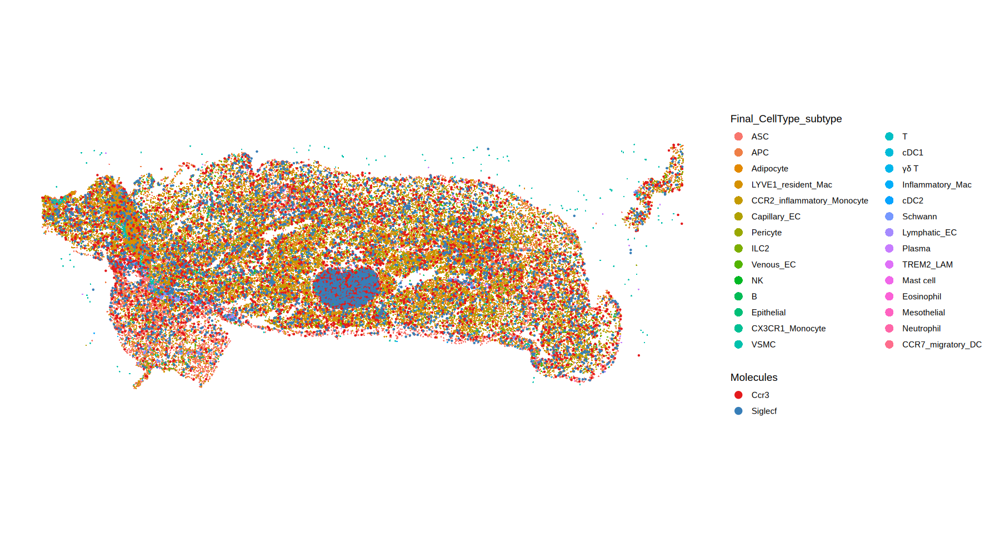

In [158]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  group.by = "Final_CellType_subtype",
  molecules = c(
    "Ccr3",
    "Siglecf"
    # "Il5ra",
    # "Alox15"
  ),
  nmols = 10000,
  flip_xy = FALSE,
  dark.background = FALSE
)